<a href="https://colab.research.google.com/github/KamranUmer/yolo_nas/blob/main/Updated_Train_yolo_nas_on_custom_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


## Install YOLO-NAS


In [ ]:
# !pip install python-dotenv

In [ ]:
!pip install -q git+https://github.com/Deci-AI/super-gradients.git@stable
# !pip install -q roboflow
!pip install -q supervision

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


### 🚨 Restart the runtime (restart session)

**After installation is complete, we will need to restart the runtime after installation completes.

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [ ]:
import torch

DEVICE = 'cuda' if torch.cuda.is_available() else "cpu"
MODEL_ARCH = 'yolo_nas_s'

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


Unzip Dataset

## Mounting Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Training YOLO-NAS on a Custom Dataset

## Preparing a custom dataset

Building a custom dataset can be a painful process. It might take dozens or even hundreds of hours to collect images, label them, and export them in the proper format. Fortunately, Roboflow makes this process as straightforward and fast as possible. Let me show you how!

### Step 1: Creating project

Before you start, you need to create a Roboflow [account](https://app.roboflow.com/login). Once you do that, you can create a new project in the Roboflow [dashboard](https://app.roboflow.com/). Keep in mind to choose the right project type. In our case, Object Detection.



### Step 2: Uploading images or video

Next, add the data to your newly created project. You can do it via API or through our [web interface](https://docs.roboflow.com/adding-data/object-detection).

If you drag and drop a directory with a dataset in a supported format, the Roboflow dashboard will automatically read the images and annotations together.


### Step 3: Labeling

If you only have images, you can label them in [Roboflow Annotate](https://docs.roboflow.com/annotate).



### Step 4: Generate new dataset version

Now that we have our images and annotations added, we can Generate a Dataset Version. When Generating a Version, you may elect to add preprocessing and augmentations. This step is completely optional, however, it can allow you to significantly improve the robustness of your model.

### Step 5: Exporting dataset

Once the dataset version is generated, we have a hosted dataset we can load directly into our notebook for easy training. Click `Export` and select the `YOLO v5 PyTorch` dataset format.






# **Import Dataset**

Manually from google drive

In [ ]:
dataset='/content/drive/MyDrive/YoloNas_Pns_detection/Dataset_PNS_Detection'


from Roboflow

### Output format

For every image YOLO-NAS will produce `ImageDetectionPrediction` object containing the following fields:
- `image` - `numpy.ndarray` - image used for inference
- `class_names` - `List[str]` - list of categories used for training the model
- `prediction` - `DetectionPrediction` - class instance containing detailed informationabout the obtained detections
   - `bboxes_xyxy` - `numpy.ndarray` of `float32` and `(N, 4)` shape - detection bounding boxes in `xyxy` format
   - `confidence` - `numpy.ndarray` of `float32` and `(N,)` shape - confidence value between `0` and `1`
   - `labels` - `numpy.ndarray` of `float32` and `(N,)` shape - `class_id` related to the index in the `class_names` list

In [ ]:
LOCATION =dataset
print("location:", LOCATION)
CLASSES = ['Effected','Normal']
print("classes:", CLASSES)

location: /content/drive/MyDrive/YoloNas_Pns_detection/Dataset_PNS_Detection
classes: ['Effected', 'Normal']


## Fine-tune on custom dataset

`ckpt_root_dir` - this is the directory where results from all your experiments will be saved

`experiment_name` - all checkpoints, logs, and tensorboards will be saved in a directory with the name you specify here.

** import Pre-trained weights **

In [ ]:
MODEL_ARCH = 'yolo_nas_s'
BATCH_SIZE = 8
MAX_EPOCHS = 100
CHECKPOINT_DIR = "/content/drive/MyDrive/YoloNas_Pns_detection/pns_detection"
EXPERIMENT_NAME = 'Pns_detection'                                               #project.name.lower().replace(" ", "_")

In [ ]:
print(CHECKPOINT_DIR)

/content/drive/MyDrive/YoloNas_Pns_detection/pns_detection


In [ ]:
from super_gradients.training import Trainer

trainer = Trainer(experiment_name=EXPERIMENT_NAME, ckpt_root_dir=CHECKPOINT_DIR)

[2024-02-28 10:16:56] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into /root/sg_logs/console.log


[2024-02-28 10:16:56] WARNING - __init__.py - Failed to import pytorch_quantization
[2024-02-28 10:16:56] INFO - utils.py - NumExpr defaulting to 2 threads.
[2024-02-28 10:17:04] WARNING - calibrator.py - Failed to import pytorch_quantization
[2024-02-28 10:17:04] WARNING - export.py - Failed to import pytorch_quantization
[2024-02-28 10:17:04] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2024-02-28 10:17:04] INFO - env_sanity_check.py - Library check is not supported when super_gradients installed through "git+https://github.com/..." command


In [ ]:
dataset_params = {
    'data_dir': LOCATION,
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': CLASSES
}

In [ ]:
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train, coco_detection_yolo_format_val)

train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

[2024-02-28 10:17:07] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 216/216 [00:51<00:00,  4.22it/s]
[2024-02-28 10:17:58] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 14/14 [00:06<00:00,  2.15it/s]
[2024-02-28 10:18:05] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.


**NOTE:** Let's inspect our dataset

In [ ]:
train_data.dataset.transforms

### Instantiate the model

In [ ]:
from super_gradients.training import models

model = models.get(
    MODEL_ARCH,
    num_classes=len(dataset_params['classes']),
    pretrained_weights="coco"
)

Indexing dataset annotations: 100%|██████████| 14/14 [00:00<00:00, 226.27it/s]
[2024-02-28 10:18:05] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_s_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_s_coco.pth
100%|██████████| 73.1M/73.1M [00:01<00:00, 46.6MB/s]
[2024-02-28 10:18:08] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_s


### Define metrics and training parameters

In [ ]:
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback

train_params = {
    'silent_mode': False,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": MAX_EPOCHS,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=2,                          #len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=2,                             #len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

### Train the model

In [ ]:
# trainer.train(
#     model=model,
#     training_params=train_params,
#     train_loader=train_data,
#     valid_loader=val_data
# )

[2024-02-15 03:12:37] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20240215_031237_615878`
[2024-02-15 03:12:37] INFO - sg_trainer.py - Checkpoints directory: /content/drive/MyDrive/YoloNas_Pns_detection/pns_detection/RUN_20240215_031237_615878
[2024-02-15 03:12:37] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}


The console stream is now moved to /content/drive/MyDrive/YoloNas_Pns_detection/pns_detection/RUN_20240215_031237_615878/console_Feb15_03_12_37.txt


Object name `linear_epoch_step` is now deprecated. Please replace it with `LinearEpochLRWarmup`.
initialize_param_groups and update_param_groups usages are deprecated since 3.4.0, will be removed in 3.5.0 and have no effect. 
 Assign different learning rates by passing a mapping of layer name prefixes to lr values through initial_lr training hyperparameter (i.e initial_lr={'backbone': 0.01, 'default':0.1})
[2024-02-15 03:12:41] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            216        (len(train_set))
    - Batch size per GPU:           8          (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             8          (num_gpus * batch_size)
    - Effective Batch size:         8          (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         27      

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.7365
│   ├── Ppyoloeloss/loss_iou = 1.0381
│   ├── Ppyoloeloss/loss_dfl = 1.1277
│   └── Ppyoloeloss/loss = 3.9023
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3965
    ├── Ppyoloeloss/loss_iou = 1.3597
    ├── Ppyoloeloss/loss_dfl = 1.2896
    ├── Ppyoloeloss/loss = 4.0458
    ├── Precision@0.50 = 0.0
    ├── Recall@0.50 = 0.0
    ├── Map@0.50 = 0.0003
    ├── F1@0.50 = 0.0
    └── Best_score_threshold = 0.03



Validating epoch 1: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s]
[2024-02-15 03:13:35] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/YoloNas_Pns_detection/pns_detection/RUN_20240215_031237_615878/ckpt_best.pth
[2024-02-15 03:13:35] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.15430602431297302


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.3842
│   │   ├── Epoch N-1      = 1.7365 (↘ -0.3523)
│   │   └── Best until now = 1.7365 (↘ -0.3523)
│   ├── Ppyoloeloss/loss_iou = 0.7599
│   │   ├── Epoch N-1      = 1.0381 (↘ -0.2782)
│   │   └── Best until now = 1.0381 (↘ -0.2782)
│   ├── Ppyoloeloss/loss_dfl = 0.8798
│   │   ├── Epoch N-1      = 1.1277 (↘ -0.2479)
│   │   └── Best until now = 1.1277 (↘ -0.2479)
│   └── Ppyoloeloss/loss = 3.0238
│       ├── Epoch N-1      = 3.9023 (↘ -0.8784)
│       └── Best until now = 3.9023 (↘ -0.8784)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.4232
    │   ├── Epoch N-1      = 1.3965 (↗ 0.0267)
    │   └── Best until now = 1.3965 (↗ 0.0267)
    ├── Ppyoloeloss/loss_iou = 0.7415
    │   ├── Epoch N-1      = 1.3597 (↘ -0.6182)
    │   └── Best until now = 1.3597 (↘ -0.6182)
    ├── Ppyoloeloss/loss_dfl = 0.8878
    │   ├── Epoch N-1      = 1.2896 (↘ -0.4018)
    │   └── Best until now = 1.2896 (↘ -0.4018)
    ├── Ppyoloeloss/loss

Validating epoch 2: 100%|██████████| 2/2 [00:00<00:00,  2.77it/s]
[2024-02-15 03:14:01] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/YoloNas_Pns_detection/pns_detection/RUN_20240215_031237_615878/ckpt_best.pth
[2024-02-15 03:14:01] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.4188433289527893


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2401
│   │   ├── Epoch N-1      = 1.3842 (↘ -0.144)
│   │   └── Best until now = 1.3842 (↘ -0.144)
│   ├── Ppyoloeloss/loss_iou = 0.6241
│   │   ├── Epoch N-1      = 0.7599 (↘ -0.1358)
│   │   └── Best until now = 0.7599 (↘ -0.1358)
│   ├── Ppyoloeloss/loss_dfl = 0.7819
│   │   ├── Epoch N-1      = 0.8798 (↘ -0.0979)
│   │   └── Best until now = 0.8798 (↘ -0.0979)
│   └── Ppyoloeloss/loss = 2.6461
│       ├── Epoch N-1      = 3.0238 (↘ -0.3778)
│       └── Best until now = 3.0238 (↘ -0.3778)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.6591
    │   ├── Epoch N-1      = 1.4232 (↗ 0.2359)
    │   └── Best until now = 1.3965 (↗ 0.2626)
    ├── Ppyoloeloss/loss_iou = 0.5968
    │   ├── Epoch N-1      = 0.7415 (↘ -0.1447)
    │   └── Best until now = 0.7415 (↘ -0.1447)
    ├── Ppyoloeloss/loss_dfl = 0.8606
    │   ├── Epoch N-1      = 0.8878 (↘ -0.0272)
    │   └── Best until now = 0.8878 (↘ -0.0272)
    ├── Ppyoloeloss/loss =

Validating epoch 3: 100%|██████████| 2/2 [00:00<00:00,  2.77it/s]
[2024-02-15 03:14:26] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/YoloNas_Pns_detection/pns_detection/RUN_20240215_031237_615878/ckpt_best.pth
[2024-02-15 03:14:26] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6601285338401794


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.167
│   │   ├── Epoch N-1      = 1.2401 (↘ -0.0731)
│   │   └── Best until now = 1.2401 (↘ -0.0731)
│   ├── Ppyoloeloss/loss_iou = 0.6083
│   │   ├── Epoch N-1      = 0.6241 (↘ -0.0158)
│   │   └── Best until now = 0.6241 (↘ -0.0158)
│   ├── Ppyoloeloss/loss_dfl = 0.7496
│   │   ├── Epoch N-1      = 0.7819 (↘ -0.0323)
│   │   └── Best until now = 0.7819 (↘ -0.0323)
│   └── Ppyoloeloss/loss = 2.5249
│       ├── Epoch N-1      = 2.6461 (↘ -0.1212)
│       └── Best until now = 2.6461 (↘ -0.1212)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1808
    │   ├── Epoch N-1      = 1.6591 (↘ -0.4783)
    │   └── Best until now = 1.3965 (↘ -0.2157)
    ├── Ppyoloeloss/loss_iou = 0.5449
    │   ├── Epoch N-1      = 0.5968 (↘ -0.0519)
    │   └── Best until now = 0.5968 (↘ -0.0519)
    ├── Ppyoloeloss/loss_dfl = 0.8376
    │   ├── Epoch N-1      = 0.8606 (↘ -0.0229)
    │   └── Best until now = 0.8606 (↘ -0.0229)
    ├── Ppyoloeloss/los

Validating epoch 4: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s]


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1149
│   │   ├── Epoch N-1      = 1.167  (↘ -0.0521)
│   │   └── Best until now = 1.167  (↘ -0.0521)
│   ├── Ppyoloeloss/loss_iou = 0.5913
│   │   ├── Epoch N-1      = 0.6083 (↘ -0.017)
│   │   └── Best until now = 0.6083 (↘ -0.017)
│   ├── Ppyoloeloss/loss_dfl = 0.7449
│   │   ├── Epoch N-1      = 0.7496 (↘ -0.0047)
│   │   └── Best until now = 0.7496 (↘ -0.0047)
│   └── Ppyoloeloss/loss = 2.4511
│       ├── Epoch N-1      = 2.5249 (↘ -0.0738)
│       └── Best until now = 2.5249 (↘ -0.0738)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0617
    │   ├── Epoch N-1      = 1.1808 (↘ -0.1191)
    │   └── Best until now = 1.1808 (↘ -0.1191)
    ├── Ppyoloeloss/loss_iou = 0.5372
    │   ├── Epoch N-1      = 0.5449 (↘ -0.0078)
    │   └── Best until now = 0.5449 (↘ -0.0078)
    ├── Ppyoloeloss/loss_dfl = 0.8321
    │   ├── Epoch N-1      = 0.8376 (↘ -0.0056)
    │   └── Best until now = 0.8376 (↘ -0.0056)
    ├── Ppyoloeloss/loss

Validating epoch 5: 100%|██████████| 2/2 [00:00<00:00,  2.74it/s]


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0728
│   │   ├── Epoch N-1      = 1.1149 (↘ -0.042)
│   │   └── Best until now = 1.1149 (↘ -0.042)
│   ├── Ppyoloeloss/loss_iou = 0.5722
│   │   ├── Epoch N-1      = 0.5913 (↘ -0.0191)
│   │   └── Best until now = 0.5913 (↘ -0.0191)
│   ├── Ppyoloeloss/loss_dfl = 0.7419
│   │   ├── Epoch N-1      = 0.7449 (↘ -0.0031)
│   │   └── Best until now = 0.7449 (↘ -0.0031)
│   └── Ppyoloeloss/loss = 2.3869
│       ├── Epoch N-1      = 2.4511 (↘ -0.0642)
│       └── Best until now = 2.4511 (↘ -0.0642)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9885
    │   ├── Epoch N-1      = 1.0617 (↘ -0.0732)
    │   └── Best until now = 1.0617 (↘ -0.0732)
    ├── Ppyoloeloss/loss_iou = 0.5528
    │   ├── Epoch N-1      = 0.5372 (↗ 0.0156)
    │   └── Best until now = 0.5372 (↗ 0.0156)
    ├── Ppyoloeloss/loss_dfl = 0.8289
    │   ├── Epoch N-1      = 0.8321 (↘ -0.0032)
    │   └── Best until now = 0.8321 (↘ -0.0032)
    ├── Ppyoloeloss/loss =

Validating epoch 6: 100%|██████████| 2/2 [00:00<00:00,  2.53it/s]
[2024-02-15 03:15:52] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/YoloNas_Pns_detection/pns_detection/RUN_20240215_031237_615878/ckpt_best.pth
[2024-02-15 03:15:52] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8583707809448242


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0816
│   │   ├── Epoch N-1      = 1.0728 (↗ 0.0088)
│   │   └── Best until now = 1.0728 (↗ 0.0088)
│   ├── Ppyoloeloss/loss_iou = 0.5697
│   │   ├── Epoch N-1      = 0.5722 (↘ -0.0025)
│   │   └── Best until now = 0.5722 (↘ -0.0025)
│   ├── Ppyoloeloss/loss_dfl = 0.7197
│   │   ├── Epoch N-1      = 0.7419 (↘ -0.0221)
│   │   └── Best until now = 0.7419 (↘ -0.0221)
│   └── Ppyoloeloss/loss = 2.3711
│       ├── Epoch N-1      = 2.3869 (↘ -0.0158)
│       └── Best until now = 2.3869 (↘ -0.0158)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.074
    │   ├── Epoch N-1      = 0.9885 (↗ 0.0855)
    │   └── Best until now = 0.9885 (↗ 0.0855)
    ├── Ppyoloeloss/loss_iou = 0.5166
    │   ├── Epoch N-1      = 0.5528 (↘ -0.0362)
    │   └── Best until now = 0.5372 (↘ -0.0206)
    ├── Ppyoloeloss/loss_dfl = 0.8142
    │   ├── Epoch N-1      = 0.8289 (↘ -0.0146)
    │   └── Best until now = 0.8289 (↘ -0.0146)
    ├── Ppyoloeloss/loss = 

Validating epoch 7: 100%|██████████| 2/2 [00:01<00:00,  1.80it/s]


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0561
│   │   ├── Epoch N-1      = 1.0816 (↘ -0.0256)
│   │   └── Best until now = 1.0728 (↘ -0.0167)
│   ├── Ppyoloeloss/loss_iou = 0.5675
│   │   ├── Epoch N-1      = 0.5697 (↘ -0.0022)
│   │   └── Best until now = 0.5697 (↘ -0.0022)
│   ├── Ppyoloeloss/loss_dfl = 0.714
│   │   ├── Epoch N-1      = 0.7197 (↘ -0.0057)
│   │   └── Best until now = 0.7197 (↘ -0.0057)
│   └── Ppyoloeloss/loss = 2.3376
│       ├── Epoch N-1      = 2.3711 (↘ -0.0335)
│       └── Best until now = 2.3711 (↘ -0.0335)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9907
    │   ├── Epoch N-1      = 1.074  (↘ -0.0834)
    │   └── Best until now = 0.9885 (↗ 0.0021)
    ├── Ppyoloeloss/loss_iou = 0.5053
    │   ├── Epoch N-1      = 0.5166 (↘ -0.0113)
    │   └── Best until now = 0.5166 (↘ -0.0113)
    ├── Ppyoloeloss/loss_dfl = 0.7636
    │   ├── Epoch N-1      = 0.8142 (↘ -0.0506)
    │   └── Best until now = 0.8142 (↘ -0.0506)
    ├── Ppyoloeloss/loss

Validating epoch 8: 100%|██████████| 2/2 [00:01<00:00,  1.89it/s]


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0456
│   │   ├── Epoch N-1      = 1.0561 (↘ -0.0105)
│   │   └── Best until now = 1.0561 (↘ -0.0105)
│   ├── Ppyoloeloss/loss_iou = 0.5615
│   │   ├── Epoch N-1      = 0.5675 (↘ -0.006)
│   │   └── Best until now = 0.5675 (↘ -0.006)
│   ├── Ppyoloeloss/loss_dfl = 0.7008
│   │   ├── Epoch N-1      = 0.714  (↘ -0.0132)
│   │   └── Best until now = 0.714  (↘ -0.0132)
│   └── Ppyoloeloss/loss = 2.3079
│       ├── Epoch N-1      = 2.3376 (↘ -0.0296)
│       └── Best until now = 2.3376 (↘ -0.0296)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.926
    │   ├── Epoch N-1      = 0.9907 (↘ -0.0647)
    │   └── Best until now = 0.9885 (↘ -0.0625)
    ├── Ppyoloeloss/loss_iou = 0.5105
    │   ├── Epoch N-1      = 0.5053 (↗ 0.0052)
    │   └── Best until now = 0.5053 (↗ 0.0052)
    ├── Ppyoloeloss/loss_dfl = 0.7693
    │   ├── Epoch N-1      = 0.7636 (↗ 0.0057)
    │   └── Best until now = 0.7636 (↗ 0.0057)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 9: 100%|██████████| 2/2 [00:00<00:00,  2.10it/s]


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0036
│   │   ├── Epoch N-1      = 1.0456 (↘ -0.042)
│   │   └── Best until now = 1.0456 (↘ -0.042)
│   ├── Ppyoloeloss/loss_iou = 0.5497
│   │   ├── Epoch N-1      = 0.5615 (↘ -0.0118)
│   │   └── Best until now = 0.5615 (↘ -0.0118)
│   ├── Ppyoloeloss/loss_dfl = 0.6791
│   │   ├── Epoch N-1      = 0.7008 (↘ -0.0218)
│   │   └── Best until now = 0.7008 (↘ -0.0218)
│   └── Ppyoloeloss/loss = 2.2324
│       ├── Epoch N-1      = 2.3079 (↘ -0.0756)
│       └── Best until now = 2.3079 (↘ -0.0756)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8346
    │   ├── Epoch N-1      = 0.926  (↘ -0.0914)
    │   └── Best until now = 0.926  (↘ -0.0914)
    ├── Ppyoloeloss/loss_iou = 0.5554
    │   ├── Epoch N-1      = 0.5105 (↗ 0.0448)
    │   └── Best until now = 0.5053 (↗ 0.05)
    ├── Ppyoloeloss/loss_dfl = 0.7885
    │   ├── Epoch N-1      = 0.7693 (↗ 0.0191)
    │   └── Best until now = 0.7636 (↗ 0.0249)
    ├── Ppyoloeloss/loss = 2.1

Validating epoch 10: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]


SUMMARY OF EPOCH 10
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0112
│   │   ├── Epoch N-1      = 1.0036 (↗ 0.0076)
│   │   └── Best until now = 1.0036 (↗ 0.0076)
│   ├── Ppyoloeloss/loss_iou = 0.546
│   │   ├── Epoch N-1      = 0.5497 (↘ -0.0036)
│   │   └── Best until now = 0.5497 (↘ -0.0036)
│   ├── Ppyoloeloss/loss_dfl = 0.6859
│   │   ├── Epoch N-1      = 0.6791 (↗ 0.0068)
│   │   └── Best until now = 0.6791 (↗ 0.0068)
│   └── Ppyoloeloss/loss = 2.2431
│       ├── Epoch N-1      = 2.2324 (↗ 0.0108)
│       └── Best until now = 2.2324 (↗ 0.0108)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9809
    │   ├── Epoch N-1      = 0.8346 (↗ 0.1464)
    │   └── Best until now = 0.8346 (↗ 0.1464)
    ├── Ppyoloeloss/loss_iou = 0.5653
    │   ├── Epoch N-1      = 0.5554 (↗ 0.0099)
    │   └── Best until now = 0.5053 (↗ 0.06)
    ├── Ppyoloeloss/loss_dfl = 0.81
    │   ├── Epoch N-1      = 0.7885 (↗ 0.0215)
    │   └── Best until now = 0.7636 (↗ 0.0464)
    ├── Ppyoloeloss/loss = 2.3562
    

Validating epoch 11: 100%|██████████| 2/2 [00:00<00:00,  2.57it/s]
[2024-02-15 03:18:16] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/YoloNas_Pns_detection/pns_detection/RUN_20240215_031237_615878/ckpt_best.pth
[2024-02-15 03:18:16] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8953315019607544


SUMMARY OF EPOCH 11
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9903
│   │   ├── Epoch N-1      = 1.0112 (↘ -0.021)
│   │   └── Best until now = 1.0036 (↘ -0.0133)
│   ├── Ppyoloeloss/loss_iou = 0.5493
│   │   ├── Epoch N-1      = 0.546  (↗ 0.0032)
│   │   └── Best until now = 0.546  (↗ 0.0032)
│   ├── Ppyoloeloss/loss_dfl = 0.6829
│   │   ├── Epoch N-1      = 0.6859 (↘ -0.0029)
│   │   └── Best until now = 0.6791 (↗ 0.0039)
│   └── Ppyoloeloss/loss = 2.2224
│       ├── Epoch N-1      = 2.2431 (↘ -0.0207)
│       └── Best until now = 2.2324 (↘ -0.0099)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9102
    │   ├── Epoch N-1      = 0.9809 (↘ -0.0707)
    │   └── Best until now = 0.8346 (↗ 0.0756)
    ├── Ppyoloeloss/loss_iou = 0.5848
    │   ├── Epoch N-1      = 0.5653 (↗ 0.0195)
    │   └── Best until now = 0.5053 (↗ 0.0794)
    ├── Ppyoloeloss/loss_dfl = 0.7747
    │   ├── Epoch N-1      = 0.81   (↘ -0.0354)
    │   └── Best until now = 0.7636 (↗ 0.0111)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 12: 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]


SUMMARY OF EPOCH 12
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9686
│   │   ├── Epoch N-1      = 0.9903 (↘ -0.0216)
│   │   └── Best until now = 0.9903 (↘ -0.0216)
│   ├── Ppyoloeloss/loss_iou = 0.5492
│   │   ├── Epoch N-1      = 0.5493 (↘ -1e-04)
│   │   └── Best until now = 0.546  (↗ 0.0032)
│   ├── Ppyoloeloss/loss_dfl = 0.6828
│   │   ├── Epoch N-1      = 0.6829 (↘ -1e-04)
│   │   └── Best until now = 0.6791 (↗ 0.0037)
│   └── Ppyoloeloss/loss = 2.2006
│       ├── Epoch N-1      = 2.2224 (↘ -0.0218)
│       └── Best until now = 2.2224 (↘ -0.0218)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8573
    │   ├── Epoch N-1      = 0.9102 (↘ -0.0529)
    │   └── Best until now = 0.8346 (↗ 0.0227)
    ├── Ppyoloeloss/loss_iou = 0.5415
    │   ├── Epoch N-1      = 0.5848 (↘ -0.0432)
    │   └── Best until now = 0.5053 (↗ 0.0362)
    ├── Ppyoloeloss/loss_dfl = 0.8098
    │   ├── Epoch N-1      = 0.7747 (↗ 0.0351)
    │   └── Best until now = 0.7636 (↗ 0.0462)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 13: 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]


SUMMARY OF EPOCH 13
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.966
│   │   ├── Epoch N-1      = 0.9686 (↘ -0.0027)
│   │   └── Best until now = 0.9686 (↘ -0.0027)
│   ├── Ppyoloeloss/loss_iou = 0.5234
│   │   ├── Epoch N-1      = 0.5492 (↘ -0.0258)
│   │   └── Best until now = 0.546  (↘ -0.0226)
│   ├── Ppyoloeloss/loss_dfl = 0.6573
│   │   ├── Epoch N-1      = 0.6828 (↘ -0.0255)
│   │   └── Best until now = 0.6791 (↘ -0.0217)
│   └── Ppyoloeloss/loss = 2.1467
│       ├── Epoch N-1      = 2.2006 (↘ -0.0539)
│       └── Best until now = 2.2006 (↘ -0.0539)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8659
    │   ├── Epoch N-1      = 0.8573 (↗ 0.0086)
    │   └── Best until now = 0.8346 (↗ 0.0313)
    ├── Ppyoloeloss/loss_iou = 0.5225
    │   ├── Epoch N-1      = 0.5415 (↘ -0.019)
    │   └── Best until now = 0.5053 (↗ 0.0172)
    ├── Ppyoloeloss/loss_dfl = 0.7602
    │   ├── Epoch N-1      = 0.8098 (↘ -0.0495)
    │   └── Best until now = 0.7636 (↘ -0.0034)
    ├── Ppyoloeloss/loss =

Validating epoch 14: 100%|██████████| 2/2 [00:00<00:00,  2.05it/s]


SUMMARY OF EPOCH 14
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9682
│   │   ├── Epoch N-1      = 0.966  (↗ 0.0022)
│   │   └── Best until now = 0.966  (↗ 0.0022)
│   ├── Ppyoloeloss/loss_iou = 0.525
│   │   ├── Epoch N-1      = 0.5234 (↗ 0.0016)
│   │   └── Best until now = 0.5234 (↗ 0.0016)
│   ├── Ppyoloeloss/loss_dfl = 0.6556
│   │   ├── Epoch N-1      = 0.6573 (↘ -0.0018)
│   │   └── Best until now = 0.6573 (↘ -0.0018)
│   └── Ppyoloeloss/loss = 2.1487
│       ├── Epoch N-1      = 2.1467 (↗ 0.002)
│       └── Best until now = 2.1467 (↗ 0.002)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8966
    │   ├── Epoch N-1      = 0.8659 (↗ 0.0307)
    │   └── Best until now = 0.8346 (↗ 0.062)
    ├── Ppyoloeloss/loss_iou = 0.5197
    │   ├── Epoch N-1      = 0.5225 (↘ -0.0028)
    │   └── Best until now = 0.5053 (↗ 0.0144)
    ├── Ppyoloeloss/loss_dfl = 0.7494
    │   ├── Epoch N-1      = 0.7602 (↘ -0.0109)
    │   └── Best until now = 0.7602 (↘ -0.0109)
    ├── Ppyoloeloss/loss = 2.1657


Validating epoch 15: 100%|██████████| 2/2 [00:01<00:00,  1.85it/s]


SUMMARY OF EPOCH 15
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9654
│   │   ├── Epoch N-1      = 0.9682 (↘ -0.0028)
│   │   └── Best until now = 0.966  (↘ -0.0006)
│   ├── Ppyoloeloss/loss_iou = 0.5317
│   │   ├── Epoch N-1      = 0.525  (↗ 0.0068)
│   │   └── Best until now = 0.5234 (↗ 0.0083)
│   ├── Ppyoloeloss/loss_dfl = 0.6692
│   │   ├── Epoch N-1      = 0.6556 (↗ 0.0136)
│   │   └── Best until now = 0.6556 (↗ 0.0136)
│   └── Ppyoloeloss/loss = 2.1663
│       ├── Epoch N-1      = 2.1487 (↗ 0.0176)
│       └── Best until now = 2.1467 (↗ 0.0196)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8139
    │   ├── Epoch N-1      = 0.8966 (↘ -0.0827)
    │   └── Best until now = 0.8346 (↘ -0.0207)
    ├── Ppyoloeloss/loss_iou = 0.4992
    │   ├── Epoch N-1      = 0.5197 (↘ -0.0205)
    │   └── Best until now = 0.5053 (↘ -0.0062)
    ├── Ppyoloeloss/loss_dfl = 0.7479
    │   ├── Epoch N-1      = 0.7494 (↘ -0.0014)
    │   └── Best until now = 0.7494 (↘ -0.0014)
    ├── Ppyoloeloss/loss = 

Validating epoch 16: 100%|██████████| 2/2 [00:00<00:00,  2.51it/s]


SUMMARY OF EPOCH 16
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9682
│   │   ├── Epoch N-1      = 0.9654 (↗ 0.0029)
│   │   └── Best until now = 0.9654 (↗ 0.0029)
│   ├── Ppyoloeloss/loss_iou = 0.5238
│   │   ├── Epoch N-1      = 0.5317 (↘ -0.008)
│   │   └── Best until now = 0.5234 (↗ 0.0003)
│   ├── Ppyoloeloss/loss_dfl = 0.6438
│   │   ├── Epoch N-1      = 0.6692 (↘ -0.0254)
│   │   └── Best until now = 0.6556 (↘ -0.0118)
│   └── Ppyoloeloss/loss = 2.1358
│       ├── Epoch N-1      = 2.1663 (↘ -0.0305)
│       └── Best until now = 2.1467 (↘ -0.0109)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9013
    │   ├── Epoch N-1      = 0.8139 (↗ 0.0874)
    │   └── Best until now = 0.8139 (↗ 0.0874)
    ├── Ppyoloeloss/loss_iou = 0.5349
    │   ├── Epoch N-1      = 0.4992 (↗ 0.0357)
    │   └── Best until now = 0.4992 (↗ 0.0357)
    ├── Ppyoloeloss/loss_dfl = 0.7466
    │   ├── Epoch N-1      = 0.7479 (↘ -0.0013)
    │   └── Best until now = 0.7479 (↘ -0.0013)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 17: 100%|██████████| 2/2 [00:01<00:00,  1.56it/s]
[2024-02-15 03:21:16] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/YoloNas_Pns_detection/pns_detection/RUN_20240215_031237_615878/ckpt_best.pth
[2024-02-15 03:21:16] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.9536532163619995


SUMMARY OF EPOCH 17
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.951
│   │   ├── Epoch N-1      = 0.9682 (↘ -0.0173)
│   │   └── Best until now = 0.9654 (↘ -0.0144)
│   ├── Ppyoloeloss/loss_iou = 0.5276
│   │   ├── Epoch N-1      = 0.5238 (↗ 0.0039)
│   │   └── Best until now = 0.5234 (↗ 0.0042)
│   ├── Ppyoloeloss/loss_dfl = 0.6598
│   │   ├── Epoch N-1      = 0.6438 (↗ 0.0159)
│   │   └── Best until now = 0.6438 (↗ 0.0159)
│   └── Ppyoloeloss/loss = 2.1383
│       ├── Epoch N-1      = 2.1358 (↗ 0.0026)
│       └── Best until now = 2.1358 (↗ 0.0026)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8049
    │   ├── Epoch N-1      = 0.9013 (↘ -0.0964)
    │   └── Best until now = 0.8139 (↘ -0.0089)
    ├── Ppyoloeloss/loss_iou = 0.5182
    │   ├── Epoch N-1      = 0.5349 (↘ -0.0167)
    │   └── Best until now = 0.4992 (↗ 0.019)
    ├── Ppyoloeloss/loss_dfl = 0.7052
    │   ├── Epoch N-1      = 0.7466 (↘ -0.0415)
    │   └── Best until now = 0.7466 (↘ -0.0415)
    ├── Ppyoloeloss/loss = 2.0

Validating epoch 18: 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]


SUMMARY OF EPOCH 18
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9264
│   │   ├── Epoch N-1      = 0.951  (↘ -0.0246)
│   │   └── Best until now = 0.951  (↘ -0.0246)
│   ├── Ppyoloeloss/loss_iou = 0.532
│   │   ├── Epoch N-1      = 0.5276 (↗ 0.0044)
│   │   └── Best until now = 0.5234 (↗ 0.0086)
│   ├── Ppyoloeloss/loss_dfl = 0.6457
│   │   ├── Epoch N-1      = 0.6598 (↘ -0.0141)
│   │   └── Best until now = 0.6438 (↗ 0.0018)
│   └── Ppyoloeloss/loss = 2.104
│       ├── Epoch N-1      = 2.1383 (↘ -0.0343)
│       └── Best until now = 2.1358 (↘ -0.0318)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7854
    │   ├── Epoch N-1      = 0.8049 (↘ -0.0195)
    │   └── Best until now = 0.8049 (↘ -0.0195)
    ├── Ppyoloeloss/loss_iou = 0.5028
    │   ├── Epoch N-1      = 0.5182 (↘ -0.0154)
    │   └── Best until now = 0.4992 (↗ 0.0036)
    ├── Ppyoloeloss/loss_dfl = 0.7136
    │   ├── Epoch N-1      = 0.7052 (↗ 0.0085)
    │   └── Best until now = 0.7052 (↗ 0.0085)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 19: 100%|██████████| 2/2 [00:00<00:00,  2.54it/s]


SUMMARY OF EPOCH 19
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9424
│   │   ├── Epoch N-1      = 0.9264 (↗ 0.016)
│   │   └── Best until now = 0.9264 (↗ 0.016)
│   ├── Ppyoloeloss/loss_iou = 0.5102
│   │   ├── Epoch N-1      = 0.532  (↘ -0.0218)
│   │   └── Best until now = 0.5234 (↘ -0.0132)
│   ├── Ppyoloeloss/loss_dfl = 0.6582
│   │   ├── Epoch N-1      = 0.6457 (↗ 0.0126)
│   │   └── Best until now = 0.6438 (↗ 0.0144)
│   └── Ppyoloeloss/loss = 2.1108
│       ├── Epoch N-1      = 2.104  (↗ 0.0067)
│       └── Best until now = 2.104  (↗ 0.0067)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8064
    │   ├── Epoch N-1      = 0.7854 (↗ 0.021)
    │   └── Best until now = 0.7854 (↗ 0.021)
    ├── Ppyoloeloss/loss_iou = 0.5198
    │   ├── Epoch N-1      = 0.5028 (↗ 0.017)
    │   └── Best until now = 0.4992 (↗ 0.0206)
    ├── Ppyoloeloss/loss_dfl = 0.7431
    │   ├── Epoch N-1      = 0.7136 (↗ 0.0295)
    │   └── Best until now = 0.7052 (↗ 0.038)
    ├── Ppyoloeloss/loss = 2.0693
    │

Validating epoch 20: 100%|██████████| 2/2 [00:00<00:00,  2.68it/s]


SUMMARY OF EPOCH 20
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.927
│   │   ├── Epoch N-1      = 0.9424 (↘ -0.0153)
│   │   └── Best until now = 0.9264 (↗ 0.0007)
│   ├── Ppyoloeloss/loss_iou = 0.5256
│   │   ├── Epoch N-1      = 0.5102 (↗ 0.0154)
│   │   └── Best until now = 0.5102 (↗ 0.0154)
│   ├── Ppyoloeloss/loss_dfl = 0.6361
│   │   ├── Epoch N-1      = 0.6582 (↘ -0.0221)
│   │   └── Best until now = 0.6438 (↘ -0.0077)
│   └── Ppyoloeloss/loss = 2.0887
│       ├── Epoch N-1      = 2.1108 (↘ -0.022)
│       └── Best until now = 2.104  (↘ -0.0153)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.829
    │   ├── Epoch N-1      = 0.8064 (↗ 0.0226)
    │   └── Best until now = 0.7854 (↗ 0.0436)
    ├── Ppyoloeloss/loss_iou = 0.5293
    │   ├── Epoch N-1      = 0.5198 (↗ 0.0095)
    │   └── Best until now = 0.4992 (↗ 0.0301)
    ├── Ppyoloeloss/loss_dfl = 0.7206
    │   ├── Epoch N-1      = 0.7431 (↘ -0.0226)
    │   └── Best until now = 0.7052 (↗ 0.0154)
    ├── Ppyoloeloss/loss = 2.078

Validating epoch 21: 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]


SUMMARY OF EPOCH 21
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.922
│   │   ├── Epoch N-1      = 0.927  (↘ -0.005)
│   │   └── Best until now = 0.9264 (↘ -0.0043)
│   ├── Ppyoloeloss/loss_iou = 0.5219
│   │   ├── Epoch N-1      = 0.5256 (↘ -0.0037)
│   │   └── Best until now = 0.5102 (↗ 0.0118)
│   ├── Ppyoloeloss/loss_dfl = 0.6343
│   │   ├── Epoch N-1      = 0.6361 (↘ -0.0018)
│   │   └── Best until now = 0.6361 (↘ -0.0018)
│   └── Ppyoloeloss/loss = 2.0783
│       ├── Epoch N-1      = 2.0887 (↘ -0.0105)
│       └── Best until now = 2.0887 (↘ -0.0105)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8858
    │   ├── Epoch N-1      = 0.829  (↗ 0.0567)
    │   └── Best until now = 0.7854 (↗ 0.1004)
    ├── Ppyoloeloss/loss_iou = 0.5084
    │   ├── Epoch N-1      = 0.5293 (↘ -0.0209)
    │   └── Best until now = 0.4992 (↗ 0.0092)
    ├── Ppyoloeloss/loss_dfl = 0.7077
    │   ├── Epoch N-1      = 0.7206 (↘ -0.0129)
    │   └── Best until now = 0.7052 (↗ 0.0025)
    ├── Ppyoloeloss/loss = 2

Validating epoch 22: 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]


SUMMARY OF EPOCH 22
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9506
│   │   ├── Epoch N-1      = 0.922  (↗ 0.0286)
│   │   └── Best until now = 0.922  (↗ 0.0286)
│   ├── Ppyoloeloss/loss_iou = 0.5242
│   │   ├── Epoch N-1      = 0.5219 (↗ 0.0023)
│   │   └── Best until now = 0.5102 (↗ 0.0141)
│   ├── Ppyoloeloss/loss_dfl = 0.6588
│   │   ├── Epoch N-1      = 0.6343 (↗ 0.0245)
│   │   └── Best until now = 0.6343 (↗ 0.0245)
│   └── Ppyoloeloss/loss = 2.1336
│       ├── Epoch N-1      = 2.0783 (↗ 0.0553)
│       └── Best until now = 2.0783 (↗ 0.0553)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9605
    │   ├── Epoch N-1      = 0.8858 (↗ 0.0747)
    │   └── Best until now = 0.7854 (↗ 0.1751)
    ├── Ppyoloeloss/loss_iou = 0.511
    │   ├── Epoch N-1      = 0.5084 (↗ 0.0027)
    │   └── Best until now = 0.4992 (↗ 0.0119)
    ├── Ppyoloeloss/loss_dfl = 0.7518
    │   ├── Epoch N-1      = 0.7077 (↗ 0.0442)
    │   └── Best until now = 0.7052 (↗ 0.0467)
    ├── Ppyoloeloss/loss = 2.2234
  

Validating epoch 23: 100%|██████████| 2/2 [00:00<00:00,  2.68it/s]


SUMMARY OF EPOCH 23
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9381
│   │   ├── Epoch N-1      = 0.9506 (↘ -0.0125)
│   │   └── Best until now = 0.922  (↗ 0.0161)
│   ├── Ppyoloeloss/loss_iou = 0.525
│   │   ├── Epoch N-1      = 0.5242 (↗ 0.0008)
│   │   └── Best until now = 0.5102 (↗ 0.0148)
│   ├── Ppyoloeloss/loss_dfl = 0.6593
│   │   ├── Epoch N-1      = 0.6588 (↗ 0.0005)
│   │   └── Best until now = 0.6343 (↗ 0.025)
│   └── Ppyoloeloss/loss = 2.1224
│       ├── Epoch N-1      = 2.1336 (↘ -0.0112)
│       └── Best until now = 2.0783 (↗ 0.0441)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7847
    │   ├── Epoch N-1      = 0.9605 (↘ -0.1758)
    │   └── Best until now = 0.7854 (↘ -0.0007)
    ├── Ppyoloeloss/loss_iou = 0.5523
    │   ├── Epoch N-1      = 0.511  (↗ 0.0413)
    │   └── Best until now = 0.4992 (↗ 0.0531)
    ├── Ppyoloeloss/loss_dfl = 0.7508
    │   ├── Epoch N-1      = 0.7518 (↘ -0.001)
    │   └── Best until now = 0.7052 (↗ 0.0457)
    ├── Ppyoloeloss/loss = 2.0879

Validating epoch 24: 100%|██████████| 2/2 [00:00<00:00,  2.65it/s]


SUMMARY OF EPOCH 24
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9227
│   │   ├── Epoch N-1      = 0.9381 (↘ -0.0154)
│   │   └── Best until now = 0.922  (↗ 0.0006)
│   ├── Ppyoloeloss/loss_iou = 0.5146
│   │   ├── Epoch N-1      = 0.525  (↘ -0.0104)
│   │   └── Best until now = 0.5102 (↗ 0.0044)
│   ├── Ppyoloeloss/loss_dfl = 0.6364
│   │   ├── Epoch N-1      = 0.6593 (↘ -0.0229)
│   │   └── Best until now = 0.6343 (↗ 0.0021)
│   └── Ppyoloeloss/loss = 2.0737
│       ├── Epoch N-1      = 2.1224 (↘ -0.0487)
│       └── Best until now = 2.0783 (↘ -0.0046)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8275
    │   ├── Epoch N-1      = 0.7847 (↗ 0.0428)
    │   └── Best until now = 0.7847 (↗ 0.0428)
    ├── Ppyoloeloss/loss_iou = 0.508
    │   ├── Epoch N-1      = 0.5523 (↘ -0.0443)
    │   └── Best until now = 0.4992 (↗ 0.0088)
    ├── Ppyoloeloss/loss_dfl = 0.6807
    │   ├── Epoch N-1      = 0.7508 (↘ -0.0701)
    │   └── Best until now = 0.7052 (↘ -0.0245)
    ├── Ppyoloeloss/loss = 2

Validating epoch 25: 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]


SUMMARY OF EPOCH 25
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8954
│   │   ├── Epoch N-1      = 0.9227 (↘ -0.0273)
│   │   └── Best until now = 0.922  (↘ -0.0267)
│   ├── Ppyoloeloss/loss_iou = 0.5029
│   │   ├── Epoch N-1      = 0.5146 (↘ -0.0116)
│   │   └── Best until now = 0.5102 (↘ -0.0072)
│   ├── Ppyoloeloss/loss_dfl = 0.6188
│   │   ├── Epoch N-1      = 0.6364 (↘ -0.0176)
│   │   └── Best until now = 0.6343 (↘ -0.0155)
│   └── Ppyoloeloss/loss = 2.0171
│       ├── Epoch N-1      = 2.0737 (↘ -0.0566)
│       └── Best until now = 2.0737 (↘ -0.0566)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8349
    │   ├── Epoch N-1      = 0.8275 (↗ 0.0074)
    │   └── Best until now = 0.7847 (↗ 0.0501)
    ├── Ppyoloeloss/loss_iou = 0.5609
    │   ├── Epoch N-1      = 0.508  (↗ 0.0529)
    │   └── Best until now = 0.4992 (↗ 0.0617)
    ├── Ppyoloeloss/loss_dfl = 0.7375
    │   ├── Epoch N-1      = 0.6807 (↗ 0.0568)
    │   └── Best until now = 0.6807 (↗ 0.0568)
    ├── Ppyoloeloss/loss = 

Validating epoch 26: 100%|██████████| 2/2 [00:01<00:00,  1.57it/s]


SUMMARY OF EPOCH 26
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9155
│   │   ├── Epoch N-1      = 0.8954 (↗ 0.0202)
│   │   └── Best until now = 0.8954 (↗ 0.0202)
│   ├── Ppyoloeloss/loss_iou = 0.5137
│   │   ├── Epoch N-1      = 0.5029 (↗ 0.0108)
│   │   └── Best until now = 0.5029 (↗ 0.0108)
│   ├── Ppyoloeloss/loss_dfl = 0.625
│   │   ├── Epoch N-1      = 0.6188 (↗ 0.0062)
│   │   └── Best until now = 0.6188 (↗ 0.0062)
│   └── Ppyoloeloss/loss = 2.0542
│       ├── Epoch N-1      = 2.0171 (↗ 0.0372)
│       └── Best until now = 2.0171 (↗ 0.0372)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8399
    │   ├── Epoch N-1      = 0.8349 (↗ 0.0051)
    │   └── Best until now = 0.7847 (↗ 0.0552)
    ├── Ppyoloeloss/loss_iou = 0.5352
    │   ├── Epoch N-1      = 0.5609 (↘ -0.0257)
    │   └── Best until now = 0.4992 (↗ 0.036)
    ├── Ppyoloeloss/loss_dfl = 0.7342
    │   ├── Epoch N-1      = 0.7375 (↘ -0.0034)
    │   └── Best until now = 0.6807 (↗ 0.0535)
    ├── Ppyoloeloss/loss = 2.1093
 

Validating epoch 27: 100%|██████████| 2/2 [00:01<00:00,  1.80it/s]


SUMMARY OF EPOCH 27
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8928
│   │   ├── Epoch N-1      = 0.9155 (↘ -0.0227)
│   │   └── Best until now = 0.8954 (↘ -0.0026)
│   ├── Ppyoloeloss/loss_iou = 0.5152
│   │   ├── Epoch N-1      = 0.5137 (↗ 0.0015)
│   │   └── Best until now = 0.5029 (↗ 0.0122)
│   ├── Ppyoloeloss/loss_dfl = 0.6312
│   │   ├── Epoch N-1      = 0.625  (↗ 0.0062)
│   │   └── Best until now = 0.6188 (↗ 0.0124)
│   └── Ppyoloeloss/loss = 2.0392
│       ├── Epoch N-1      = 2.0542 (↘ -0.0151)
│       └── Best until now = 2.0171 (↗ 0.0221)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7895
    │   ├── Epoch N-1      = 0.8399 (↘ -0.0504)
    │   └── Best until now = 0.7847 (↗ 0.0048)
    ├── Ppyoloeloss/loss_iou = 0.5209
    │   ├── Epoch N-1      = 0.5352 (↘ -0.0143)
    │   └── Best until now = 0.4992 (↗ 0.0217)
    ├── Ppyoloeloss/loss_dfl = 0.6908
    │   ├── Epoch N-1      = 0.7342 (↘ -0.0433)
    │   └── Best until now = 0.6807 (↗ 0.0101)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 28: 100%|██████████| 2/2 [00:00<00:00,  2.68it/s]


SUMMARY OF EPOCH 28
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8945
│   │   ├── Epoch N-1      = 0.8928 (↗ 0.0017)
│   │   └── Best until now = 0.8928 (↗ 0.0017)
│   ├── Ppyoloeloss/loss_iou = 0.506
│   │   ├── Epoch N-1      = 0.5152 (↘ -0.0092)
│   │   └── Best until now = 0.5029 (↗ 0.0031)
│   ├── Ppyoloeloss/loss_dfl = 0.6066
│   │   ├── Epoch N-1      = 0.6312 (↘ -0.0246)
│   │   └── Best until now = 0.6188 (↘ -0.0122)
│   └── Ppyoloeloss/loss = 2.0071
│       ├── Epoch N-1      = 2.0392 (↘ -0.0321)
│       └── Best until now = 2.0171 (↘ -0.01)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7451
    │   ├── Epoch N-1      = 0.7895 (↘ -0.0444)
    │   └── Best until now = 0.7847 (↘ -0.0396)
    ├── Ppyoloeloss/loss_iou = 0.5305
    │   ├── Epoch N-1      = 0.5209 (↗ 0.0096)
    │   └── Best until now = 0.4992 (↗ 0.0313)
    ├── Ppyoloeloss/loss_dfl = 0.7335
    │   ├── Epoch N-1      = 0.6908 (↗ 0.0427)
    │   └── Best until now = 0.6807 (↗ 0.0528)
    ├── Ppyoloeloss/loss = 2.00

Validating epoch 29: 100%|██████████| 2/2 [00:00<00:00,  2.73it/s]


SUMMARY OF EPOCH 29
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.881
│   │   ├── Epoch N-1      = 0.8945 (↘ -0.0134)
│   │   └── Best until now = 0.8928 (↘ -0.0118)
│   ├── Ppyoloeloss/loss_iou = 0.514
│   │   ├── Epoch N-1      = 0.506  (↗ 0.008)
│   │   └── Best until now = 0.5029 (↗ 0.0111)
│   ├── Ppyoloeloss/loss_dfl = 0.6253
│   │   ├── Epoch N-1      = 0.6066 (↗ 0.0187)
│   │   └── Best until now = 0.6066 (↗ 0.0187)
│   └── Ppyoloeloss/loss = 2.0203
│       ├── Epoch N-1      = 2.0071 (↗ 0.0132)
│       └── Best until now = 2.0071 (↗ 0.0132)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8089
    │   ├── Epoch N-1      = 0.7451 (↗ 0.0638)
    │   └── Best until now = 0.7451 (↗ 0.0638)
    ├── Ppyoloeloss/loss_iou = 0.5337
    │   ├── Epoch N-1      = 0.5305 (↗ 0.0032)
    │   └── Best until now = 0.4992 (↗ 0.0345)
    ├── Ppyoloeloss/loss_dfl = 0.7461
    │   ├── Epoch N-1      = 0.7335 (↗ 0.0126)
    │   └── Best until now = 0.6807 (↗ 0.0654)
    ├── Ppyoloeloss/loss = 2.0886
  

Validating epoch 30: 100%|██████████| 2/2 [00:00<00:00,  2.59it/s]


SUMMARY OF EPOCH 30
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9031
│   │   ├── Epoch N-1      = 0.881  (↗ 0.0221)
│   │   └── Best until now = 0.881  (↗ 0.0221)
│   ├── Ppyoloeloss/loss_iou = 0.4927
│   │   ├── Epoch N-1      = 0.514  (↘ -0.0213)
│   │   └── Best until now = 0.5029 (↘ -0.0102)
│   ├── Ppyoloeloss/loss_dfl = 0.6169
│   │   ├── Epoch N-1      = 0.6253 (↘ -0.0084)
│   │   └── Best until now = 0.6066 (↗ 0.0103)
│   └── Ppyoloeloss/loss = 2.0127
│       ├── Epoch N-1      = 2.0203 (↘ -0.0076)
│       └── Best until now = 2.0071 (↗ 0.0056)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7787
    │   ├── Epoch N-1      = 0.8089 (↘ -0.0302)
    │   └── Best until now = 0.7451 (↗ 0.0336)
    ├── Ppyoloeloss/loss_iou = 0.5508
    │   ├── Epoch N-1      = 0.5337 (↗ 0.0171)
    │   └── Best until now = 0.4992 (↗ 0.0516)
    ├── Ppyoloeloss/loss_dfl = 0.7488
    │   ├── Epoch N-1      = 0.7461 (↗ 0.0027)
    │   └── Best until now = 0.6807 (↗ 0.0682)
    ├── Ppyoloeloss/loss = 2.0

Validating epoch 31: 100%|██████████| 2/2 [00:00<00:00,  2.13it/s]


SUMMARY OF EPOCH 31
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.901
│   │   ├── Epoch N-1      = 0.9031 (↘ -0.0021)
│   │   └── Best until now = 0.881  (↗ 0.0199)
│   ├── Ppyoloeloss/loss_iou = 0.5156
│   │   ├── Epoch N-1      = 0.4927 (↗ 0.0229)
│   │   └── Best until now = 0.4927 (↗ 0.0229)
│   ├── Ppyoloeloss/loss_dfl = 0.6252
│   │   ├── Epoch N-1      = 0.6169 (↗ 0.0083)
│   │   └── Best until now = 0.6066 (↗ 0.0186)
│   └── Ppyoloeloss/loss = 2.0418
│       ├── Epoch N-1      = 2.0127 (↗ 0.0291)
│       └── Best until now = 2.0071 (↗ 0.0347)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7901
    │   ├── Epoch N-1      = 0.7787 (↗ 0.0114)
    │   └── Best until now = 0.7451 (↗ 0.045)
    ├── Ppyoloeloss/loss_iou = 0.5174
    │   ├── Epoch N-1      = 0.5508 (↘ -0.0334)
    │   └── Best until now = 0.4992 (↗ 0.0182)
    ├── Ppyoloeloss/loss_dfl = 0.7139
    │   ├── Epoch N-1      = 0.7488 (↘ -0.0349)
    │   └── Best until now = 0.6807 (↗ 0.0332)
    ├── Ppyoloeloss/loss = 2.0214


Validating epoch 32: 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]


SUMMARY OF EPOCH 32
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9061
│   │   ├── Epoch N-1      = 0.901  (↗ 0.0051)
│   │   └── Best until now = 0.881  (↗ 0.025)
│   ├── Ppyoloeloss/loss_iou = 0.5103
│   │   ├── Epoch N-1      = 0.5156 (↘ -0.0053)
│   │   └── Best until now = 0.4927 (↗ 0.0176)
│   ├── Ppyoloeloss/loss_dfl = 0.6053
│   │   ├── Epoch N-1      = 0.6252 (↘ -0.0199)
│   │   └── Best until now = 0.6066 (↘ -0.0013)
│   └── Ppyoloeloss/loss = 2.0217
│       ├── Epoch N-1      = 2.0418 (↘ -0.0201)
│       └── Best until now = 2.0071 (↗ 0.0146)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8195
    │   ├── Epoch N-1      = 0.7901 (↗ 0.0294)
    │   └── Best until now = 0.7451 (↗ 0.0744)
    ├── Ppyoloeloss/loss_iou = 0.5504
    │   ├── Epoch N-1      = 0.5174 (↗ 0.033)
    │   └── Best until now = 0.4992 (↗ 0.0512)
    ├── Ppyoloeloss/loss_dfl = 0.7155
    │   ├── Epoch N-1      = 0.7139 (↗ 0.0016)
    │   └── Best until now = 0.6807 (↗ 0.0348)
    ├── Ppyoloeloss/loss = 2.0854

Validating epoch 33: 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]


SUMMARY OF EPOCH 33
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8918
│   │   ├── Epoch N-1      = 0.9061 (↘ -0.0143)
│   │   └── Best until now = 0.881  (↗ 0.0107)
│   ├── Ppyoloeloss/loss_iou = 0.4928
│   │   ├── Epoch N-1      = 0.5103 (↘ -0.0175)
│   │   └── Best until now = 0.4927 (↗ 0.0)
│   ├── Ppyoloeloss/loss_dfl = 0.616
│   │   ├── Epoch N-1      = 0.6053 (↗ 0.0107)
│   │   └── Best until now = 0.6053 (↗ 0.0107)
│   └── Ppyoloeloss/loss = 2.0006
│       ├── Epoch N-1      = 2.0217 (↘ -0.0211)
│       └── Best until now = 2.0071 (↘ -0.0065)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7614
    │   ├── Epoch N-1      = 0.8195 (↘ -0.0581)
    │   └── Best until now = 0.7451 (↗ 0.0163)
    ├── Ppyoloeloss/loss_iou = 0.5246
    │   ├── Epoch N-1      = 0.5504 (↘ -0.0258)
    │   └── Best until now = 0.4992 (↗ 0.0254)
    ├── Ppyoloeloss/loss_dfl = 0.7543
    │   ├── Epoch N-1      = 0.7155 (↗ 0.0388)
    │   └── Best until now = 0.6807 (↗ 0.0736)
    ├── Ppyoloeloss/loss = 2.0403

Validating epoch 34: 100%|██████████| 2/2 [00:00<00:00,  2.42it/s]


SUMMARY OF EPOCH 34
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8873
│   │   ├── Epoch N-1      = 0.8918 (↘ -0.0044)
│   │   └── Best until now = 0.881  (↗ 0.0063)
│   ├── Ppyoloeloss/loss_iou = 0.4895
│   │   ├── Epoch N-1      = 0.4928 (↘ -0.0033)
│   │   └── Best until now = 0.4927 (↘ -0.0032)
│   ├── Ppyoloeloss/loss_dfl = 0.6101
│   │   ├── Epoch N-1      = 0.616  (↘ -0.006)
│   │   └── Best until now = 0.6053 (↗ 0.0047)
│   └── Ppyoloeloss/loss = 1.9869
│       ├── Epoch N-1      = 2.0006 (↘ -0.0137)
│       └── Best until now = 2.0006 (↘ -0.0137)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8078
    │   ├── Epoch N-1      = 0.7614 (↗ 0.0464)
    │   └── Best until now = 0.7451 (↗ 0.0627)
    ├── Ppyoloeloss/loss_iou = 0.5082
    │   ├── Epoch N-1      = 0.5246 (↘ -0.0164)
    │   └── Best until now = 0.4992 (↗ 0.009)
    ├── Ppyoloeloss/loss_dfl = 0.7314
    │   ├── Epoch N-1      = 0.7543 (↘ -0.0228)
    │   └── Best until now = 0.6807 (↗ 0.0508)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 35: 100%|██████████| 2/2 [00:00<00:00,  2.62it/s]


SUMMARY OF EPOCH 35
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8894
│   │   ├── Epoch N-1      = 0.8873 (↗ 0.0021)
│   │   └── Best until now = 0.881  (↗ 0.0084)
│   ├── Ppyoloeloss/loss_iou = 0.5042
│   │   ├── Epoch N-1      = 0.4895 (↗ 0.0147)
│   │   └── Best until now = 0.4895 (↗ 0.0147)
│   ├── Ppyoloeloss/loss_dfl = 0.6187
│   │   ├── Epoch N-1      = 0.6101 (↗ 0.0086)
│   │   └── Best until now = 0.6053 (↗ 0.0134)
│   └── Ppyoloeloss/loss = 2.0123
│       ├── Epoch N-1      = 1.9869 (↗ 0.0254)
│       └── Best until now = 1.9869 (↗ 0.0254)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7935
    │   ├── Epoch N-1      = 0.8078 (↘ -0.0143)
    │   └── Best until now = 0.7451 (↗ 0.0484)
    ├── Ppyoloeloss/loss_iou = 0.5575
    │   ├── Epoch N-1      = 0.5082 (↗ 0.0493)
    │   └── Best until now = 0.4992 (↗ 0.0583)
    ├── Ppyoloeloss/loss_dfl = 0.7657
    │   ├── Epoch N-1      = 0.7314 (↗ 0.0342)
    │   └── Best until now = 0.6807 (↗ 0.085)
    ├── Ppyoloeloss/loss = 2.1167
 

Validating epoch 36: 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]


SUMMARY OF EPOCH 36
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9069
│   │   ├── Epoch N-1      = 0.8894 (↗ 0.0175)
│   │   └── Best until now = 0.881  (↗ 0.0259)
│   ├── Ppyoloeloss/loss_iou = 0.4903
│   │   ├── Epoch N-1      = 0.5042 (↘ -0.0139)
│   │   └── Best until now = 0.4895 (↗ 0.0008)
│   ├── Ppyoloeloss/loss_dfl = 0.6067
│   │   ├── Epoch N-1      = 0.6187 (↘ -0.0119)
│   │   └── Best until now = 0.6053 (↗ 0.0014)
│   └── Ppyoloeloss/loss = 2.0039
│       ├── Epoch N-1      = 2.0123 (↘ -0.0084)
│       └── Best until now = 1.9869 (↗ 0.017)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7221
    │   ├── Epoch N-1      = 0.7935 (↘ -0.0713)
    │   └── Best until now = 0.7451 (↘ -0.023)
    ├── Ppyoloeloss/loss_iou = 0.5315
    │   ├── Epoch N-1      = 0.5575 (↘ -0.026)
    │   └── Best until now = 0.4992 (↗ 0.0323)
    ├── Ppyoloeloss/loss_dfl = 0.7055
    │   ├── Epoch N-1      = 0.7657 (↘ -0.0602)
    │   └── Best until now = 0.6807 (↗ 0.0248)
    ├── Ppyoloeloss/loss = 1.95

Validating epoch 37: 100%|██████████| 2/2 [00:00<00:00,  2.63it/s]


SUMMARY OF EPOCH 37
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8694
│   │   ├── Epoch N-1      = 0.9069 (↘ -0.0375)
│   │   └── Best until now = 0.881  (↘ -0.0116)
│   ├── Ppyoloeloss/loss_iou = 0.4863
│   │   ├── Epoch N-1      = 0.4903 (↘ -0.004)
│   │   └── Best until now = 0.4895 (↘ -0.0032)
│   ├── Ppyoloeloss/loss_dfl = 0.5922
│   │   ├── Epoch N-1      = 0.6067 (↘ -0.0145)
│   │   └── Best until now = 0.6053 (↘ -0.0131)
│   └── Ppyoloeloss/loss = 1.9479
│       ├── Epoch N-1      = 2.0039 (↘ -0.056)
│       └── Best until now = 1.9869 (↘ -0.039)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7656
    │   ├── Epoch N-1      = 0.7221 (↗ 0.0435)
    │   └── Best until now = 0.7221 (↗ 0.0435)
    ├── Ppyoloeloss/loss_iou = 0.5233
    │   ├── Epoch N-1      = 0.5315 (↘ -0.0082)
    │   └── Best until now = 0.4992 (↗ 0.0241)
    ├── Ppyoloeloss/loss_dfl = 0.705
    │   ├── Epoch N-1      = 0.7055 (↘ -0.0004)
    │   └── Best until now = 0.6807 (↗ 0.0244)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 38: 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]


SUMMARY OF EPOCH 38
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8837
│   │   ├── Epoch N-1      = 0.8694 (↗ 0.0143)
│   │   └── Best until now = 0.8694 (↗ 0.0143)
│   ├── Ppyoloeloss/loss_iou = 0.4981
│   │   ├── Epoch N-1      = 0.4863 (↗ 0.0118)
│   │   └── Best until now = 0.4863 (↗ 0.0118)
│   ├── Ppyoloeloss/loss_dfl = 0.6058
│   │   ├── Epoch N-1      = 0.5922 (↗ 0.0135)
│   │   └── Best until now = 0.5922 (↗ 0.0135)
│   └── Ppyoloeloss/loss = 1.9876
│       ├── Epoch N-1      = 1.9479 (↗ 0.0397)
│       └── Best until now = 1.9479 (↗ 0.0397)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7819
    │   ├── Epoch N-1      = 0.7656 (↗ 0.0163)
    │   └── Best until now = 0.7221 (↗ 0.0598)
    ├── Ppyoloeloss/loss_iou = 0.5244
    │   ├── Epoch N-1      = 0.5233 (↗ 0.0011)
    │   └── Best until now = 0.4992 (↗ 0.0252)
    ├── Ppyoloeloss/loss_dfl = 0.6982
    │   ├── Epoch N-1      = 0.705  (↘ -0.0068)
    │   └── Best until now = 0.6807 (↗ 0.0175)
    ├── Ppyoloeloss/loss = 2.0045


Validating epoch 39: 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]


SUMMARY OF EPOCH 39
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8804
│   │   ├── Epoch N-1      = 0.8837 (↘ -0.0033)
│   │   └── Best until now = 0.8694 (↗ 0.011)
│   ├── Ppyoloeloss/loss_iou = 0.4927
│   │   ├── Epoch N-1      = 0.4981 (↘ -0.0054)
│   │   └── Best until now = 0.4863 (↗ 0.0064)
│   ├── Ppyoloeloss/loss_dfl = 0.6095
│   │   ├── Epoch N-1      = 0.6058 (↗ 0.0038)
│   │   └── Best until now = 0.5922 (↗ 0.0173)
│   └── Ppyoloeloss/loss = 1.9827
│       ├── Epoch N-1      = 1.9876 (↘ -0.0049)
│       └── Best until now = 1.9479 (↗ 0.0347)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.814
    │   ├── Epoch N-1      = 0.7819 (↗ 0.0321)
    │   └── Best until now = 0.7221 (↗ 0.0919)
    ├── Ppyoloeloss/loss_iou = 0.5123
    │   ├── Epoch N-1      = 0.5244 (↘ -0.0121)
    │   └── Best until now = 0.4992 (↗ 0.0131)
    ├── Ppyoloeloss/loss_dfl = 0.719
    │   ├── Epoch N-1      = 0.6982 (↗ 0.0208)
    │   └── Best until now = 0.6807 (↗ 0.0383)
    ├── Ppyoloeloss/loss = 2.0453


Validating epoch 40: 100%|██████████| 2/2 [00:00<00:00,  2.10it/s]


SUMMARY OF EPOCH 40
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8789
│   │   ├── Epoch N-1      = 0.8804 (↘ -0.0015)
│   │   └── Best until now = 0.8694 (↗ 0.0095)
│   ├── Ppyoloeloss/loss_iou = 0.4982
│   │   ├── Epoch N-1      = 0.4927 (↗ 0.0055)
│   │   └── Best until now = 0.4863 (↗ 0.0119)
│   ├── Ppyoloeloss/loss_dfl = 0.6177
│   │   ├── Epoch N-1      = 0.6095 (↗ 0.0082)
│   │   └── Best until now = 0.5922 (↗ 0.0255)
│   └── Ppyoloeloss/loss = 1.9949
│       ├── Epoch N-1      = 1.9827 (↗ 0.0122)
│       └── Best until now = 1.9479 (↗ 0.0469)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8343
    │   ├── Epoch N-1      = 0.814  (↗ 0.0203)
    │   └── Best until now = 0.7221 (↗ 0.1122)
    ├── Ppyoloeloss/loss_iou = 0.5303
    │   ├── Epoch N-1      = 0.5123 (↗ 0.018)
    │   └── Best until now = 0.4992 (↗ 0.0311)
    ├── Ppyoloeloss/loss_dfl = 0.7382
    │   ├── Epoch N-1      = 0.719  (↗ 0.0193)
    │   └── Best until now = 0.6807 (↗ 0.0576)
    ├── Ppyoloeloss/loss = 2.1029
 

Validating epoch 41: 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]


SUMMARY OF EPOCH 41
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8407
│   │   ├── Epoch N-1      = 0.8789 (↘ -0.0382)
│   │   └── Best until now = 0.8694 (↘ -0.0287)
│   ├── Ppyoloeloss/loss_iou = 0.4862
│   │   ├── Epoch N-1      = 0.4982 (↘ -0.012)
│   │   └── Best until now = 0.4863 (↘ -1e-04)
│   ├── Ppyoloeloss/loss_dfl = 0.5976
│   │   ├── Epoch N-1      = 0.6177 (↘ -0.0201)
│   │   └── Best until now = 0.5922 (↗ 0.0054)
│   └── Ppyoloeloss/loss = 1.9246
│       ├── Epoch N-1      = 1.9949 (↘ -0.0703)
│       └── Best until now = 1.9479 (↘ -0.0234)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7495
    │   ├── Epoch N-1      = 0.8343 (↘ -0.0848)
    │   └── Best until now = 0.7221 (↗ 0.0274)
    ├── Ppyoloeloss/loss_iou = 0.5435
    │   ├── Epoch N-1      = 0.5303 (↗ 0.0131)
    │   └── Best until now = 0.4992 (↗ 0.0443)
    ├── Ppyoloeloss/loss_dfl = 0.7605
    │   ├── Epoch N-1      = 0.7382 (↗ 0.0223)
    │   └── Best until now = 0.6807 (↗ 0.0798)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 42: 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]


SUMMARY OF EPOCH 42
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8654
│   │   ├── Epoch N-1      = 0.8407 (↗ 0.0246)
│   │   └── Best until now = 0.8407 (↗ 0.0246)
│   ├── Ppyoloeloss/loss_iou = 0.4798
│   │   ├── Epoch N-1      = 0.4862 (↘ -0.0064)
│   │   └── Best until now = 0.4862 (↘ -0.0064)
│   ├── Ppyoloeloss/loss_dfl = 0.5958
│   │   ├── Epoch N-1      = 0.5976 (↘ -0.0019)
│   │   └── Best until now = 0.5922 (↗ 0.0036)
│   └── Ppyoloeloss/loss = 1.941
│       ├── Epoch N-1      = 1.9246 (↗ 0.0164)
│       └── Best until now = 1.9246 (↗ 0.0164)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9549
    │   ├── Epoch N-1      = 0.7495 (↗ 0.2054)
    │   └── Best until now = 0.7221 (↗ 0.2328)
    ├── Ppyoloeloss/loss_iou = 0.525
    │   ├── Epoch N-1      = 0.5435 (↘ -0.0184)
    │   └── Best until now = 0.4992 (↗ 0.0258)
    ├── Ppyoloeloss/loss_dfl = 0.7144
    │   ├── Epoch N-1      = 0.7605 (↘ -0.0461)
    │   └── Best until now = 0.6807 (↗ 0.0337)
    ├── Ppyoloeloss/loss = 2.194

Validating epoch 43: 100%|██████████| 2/2 [00:00<00:00,  2.05it/s]


SUMMARY OF EPOCH 43
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8575
│   │   ├── Epoch N-1      = 0.8654 (↘ -0.0079)
│   │   └── Best until now = 0.8407 (↗ 0.0167)
│   ├── Ppyoloeloss/loss_iou = 0.4707
│   │   ├── Epoch N-1      = 0.4798 (↘ -0.0091)
│   │   └── Best until now = 0.4798 (↘ -0.0091)
│   ├── Ppyoloeloss/loss_dfl = 0.5906
│   │   ├── Epoch N-1      = 0.5958 (↘ -0.0052)
│   │   └── Best until now = 0.5922 (↘ -0.0016)
│   └── Ppyoloeloss/loss = 1.9187
│       ├── Epoch N-1      = 1.941  (↘ -0.0222)
│       └── Best until now = 1.9246 (↘ -0.0058)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8044
    │   ├── Epoch N-1      = 0.9549 (↘ -0.1506)
    │   └── Best until now = 0.7221 (↗ 0.0822)
    ├── Ppyoloeloss/loss_iou = 0.4835
    │   ├── Epoch N-1      = 0.525  (↘ -0.0415)
    │   └── Best until now = 0.4992 (↘ -0.0157)
    ├── Ppyoloeloss/loss_dfl = 0.6884
    │   ├── Epoch N-1      = 0.7144 (↘ -0.026)
    │   └── Best until now = 0.6807 (↗ 0.0077)
    ├── Ppyoloeloss/loss 

Validating epoch 44: 100%|██████████| 2/2 [00:00<00:00,  2.64it/s]


SUMMARY OF EPOCH 44
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8592
│   │   ├── Epoch N-1      = 0.8575 (↗ 0.0018)
│   │   └── Best until now = 0.8407 (↗ 0.0185)
│   ├── Ppyoloeloss/loss_iou = 0.4915
│   │   ├── Epoch N-1      = 0.4707 (↗ 0.0208)
│   │   └── Best until now = 0.4707 (↗ 0.0208)
│   ├── Ppyoloeloss/loss_dfl = 0.5965
│   │   ├── Epoch N-1      = 0.5906 (↗ 0.0059)
│   │   └── Best until now = 0.5906 (↗ 0.0059)
│   └── Ppyoloeloss/loss = 1.9472
│       ├── Epoch N-1      = 1.9187 (↗ 0.0285)
│       └── Best until now = 1.9187 (↗ 0.0285)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8299
    │   ├── Epoch N-1      = 0.8044 (↗ 0.0255)
    │   └── Best until now = 0.7221 (↗ 0.1078)
    ├── Ppyoloeloss/loss_iou = 0.5173
    │   ├── Epoch N-1      = 0.4835 (↗ 0.0338)
    │   └── Best until now = 0.4835 (↗ 0.0338)
    ├── Ppyoloeloss/loss_dfl = 0.7059
    │   ├── Epoch N-1      = 0.6884 (↗ 0.0175)
    │   └── Best until now = 0.6807 (↗ 0.0252)
    ├── Ppyoloeloss/loss = 2.0531
 

Validating epoch 45: 100%|██████████| 2/2 [00:00<00:00,  2.62it/s]


SUMMARY OF EPOCH 45
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8677
│   │   ├── Epoch N-1      = 0.8592 (↗ 0.0085)
│   │   └── Best until now = 0.8407 (↗ 0.0269)
│   ├── Ppyoloeloss/loss_iou = 0.4838
│   │   ├── Epoch N-1      = 0.4915 (↘ -0.0077)
│   │   └── Best until now = 0.4707 (↗ 0.0131)
│   ├── Ppyoloeloss/loss_dfl = 0.5876
│   │   ├── Epoch N-1      = 0.5965 (↘ -0.0089)
│   │   └── Best until now = 0.5906 (↘ -0.003)
│   └── Ppyoloeloss/loss = 1.9391
│       ├── Epoch N-1      = 1.9472 (↘ -0.0082)
│       └── Best until now = 1.9187 (↗ 0.0203)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7963
    │   ├── Epoch N-1      = 0.8299 (↘ -0.0336)
    │   └── Best until now = 0.7221 (↗ 0.0742)
    ├── Ppyoloeloss/loss_iou = 0.5237
    │   ├── Epoch N-1      = 0.5173 (↗ 0.0064)
    │   └── Best until now = 0.4835 (↗ 0.0402)
    ├── Ppyoloeloss/loss_dfl = 0.7171
    │   ├── Epoch N-1      = 0.7059 (↗ 0.0112)
    │   └── Best until now = 0.6807 (↗ 0.0364)
    ├── Ppyoloeloss/loss = 2.03

Validating epoch 46: 100%|██████████| 2/2 [00:00<00:00,  2.67it/s]


SUMMARY OF EPOCH 46
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8406
│   │   ├── Epoch N-1      = 0.8677 (↘ -0.0271)
│   │   └── Best until now = 0.8407 (↘ -1e-04)
│   ├── Ppyoloeloss/loss_iou = 0.4659
│   │   ├── Epoch N-1      = 0.4838 (↘ -0.0179)
│   │   └── Best until now = 0.4707 (↘ -0.0047)
│   ├── Ppyoloeloss/loss_dfl = 0.5795
│   │   ├── Epoch N-1      = 0.5876 (↘ -0.0081)
│   │   └── Best until now = 0.5876 (↘ -0.0081)
│   └── Ppyoloeloss/loss = 1.886
│       ├── Epoch N-1      = 1.9391 (↘ -0.053)
│       └── Best until now = 1.9187 (↘ -0.0327)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7849
    │   ├── Epoch N-1      = 0.7963 (↘ -0.0114)
    │   └── Best until now = 0.7221 (↗ 0.0628)
    ├── Ppyoloeloss/loss_iou = 0.5005
    │   ├── Epoch N-1      = 0.5237 (↘ -0.0232)
    │   └── Best until now = 0.4835 (↗ 0.017)
    ├── Ppyoloeloss/loss_dfl = 0.6708
    │   ├── Epoch N-1      = 0.7171 (↘ -0.0463)
    │   └── Best until now = 0.6807 (↘ -0.0099)
    ├── Ppyoloeloss/loss = 

Validating epoch 47: 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]


SUMMARY OF EPOCH 47
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8427
│   │   ├── Epoch N-1      = 0.8406 (↗ 0.002)
│   │   └── Best until now = 0.8406 (↗ 0.002)
│   ├── Ppyoloeloss/loss_iou = 0.4724
│   │   ├── Epoch N-1      = 0.4659 (↗ 0.0064)
│   │   └── Best until now = 0.4659 (↗ 0.0064)
│   ├── Ppyoloeloss/loss_dfl = 0.5829
│   │   ├── Epoch N-1      = 0.5795 (↗ 0.0034)
│   │   └── Best until now = 0.5795 (↗ 0.0034)
│   └── Ppyoloeloss/loss = 1.898
│       ├── Epoch N-1      = 1.886  (↗ 0.0119)
│       └── Best until now = 1.886  (↗ 0.0119)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7513
    │   ├── Epoch N-1      = 0.7849 (↘ -0.0336)
    │   └── Best until now = 0.7221 (↗ 0.0292)
    ├── Ppyoloeloss/loss_iou = 0.5391
    │   ├── Epoch N-1      = 0.5005 (↗ 0.0386)
    │   └── Best until now = 0.4835 (↗ 0.0556)
    ├── Ppyoloeloss/loss_dfl = 0.7263
    │   ├── Epoch N-1      = 0.6708 (↗ 0.0555)
    │   └── Best until now = 0.6708 (↗ 0.0555)
    ├── Ppyoloeloss/loss = 2.0167
   

Validating epoch 48: 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]


SUMMARY OF EPOCH 48
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8569
│   │   ├── Epoch N-1      = 0.8427 (↗ 0.0143)
│   │   └── Best until now = 0.8406 (↗ 0.0163)
│   ├── Ppyoloeloss/loss_iou = 0.4728
│   │   ├── Epoch N-1      = 0.4724 (↗ 0.0004)
│   │   └── Best until now = 0.4659 (↗ 0.0068)
│   ├── Ppyoloeloss/loss_dfl = 0.5856
│   │   ├── Epoch N-1      = 0.5829 (↗ 0.0027)
│   │   └── Best until now = 0.5795 (↗ 0.0062)
│   └── Ppyoloeloss/loss = 1.9153
│       ├── Epoch N-1      = 1.898  (↗ 0.0174)
│       └── Best until now = 1.886  (↗ 0.0293)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7521
    │   ├── Epoch N-1      = 0.7513 (↗ 0.0008)
    │   └── Best until now = 0.7221 (↗ 0.03)
    ├── Ppyoloeloss/loss_iou = 0.5251
    │   ├── Epoch N-1      = 0.5391 (↘ -0.014)
    │   └── Best until now = 0.4835 (↗ 0.0416)
    ├── Ppyoloeloss/loss_dfl = 0.6987
    │   ├── Epoch N-1      = 0.7263 (↘ -0.0276)
    │   └── Best until now = 0.6708 (↗ 0.0279)
    ├── Ppyoloeloss/loss = 1.9759
  

Validating epoch 49: 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]


SUMMARY OF EPOCH 49
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8508
│   │   ├── Epoch N-1      = 0.8569 (↘ -0.0061)
│   │   └── Best until now = 0.8406 (↗ 0.0101)
│   ├── Ppyoloeloss/loss_iou = 0.4728
│   │   ├── Epoch N-1      = 0.4728 (↗ 0.0)
│   │   └── Best until now = 0.4659 (↗ 0.0068)
│   ├── Ppyoloeloss/loss_dfl = 0.5844
│   │   ├── Epoch N-1      = 0.5856 (↘ -0.0013)
│   │   └── Best until now = 0.5795 (↗ 0.0049)
│   └── Ppyoloeloss/loss = 1.9079
│       ├── Epoch N-1      = 1.9153 (↘ -0.0074)
│       └── Best until now = 1.886  (↗ 0.0219)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.737
    │   ├── Epoch N-1      = 0.7521 (↘ -0.0151)
    │   └── Best until now = 0.7221 (↗ 0.0149)
    ├── Ppyoloeloss/loss_iou = 0.5463
    │   ├── Epoch N-1      = 0.5251 (↗ 0.0213)
    │   └── Best until now = 0.4835 (↗ 0.0629)
    ├── Ppyoloeloss/loss_dfl = 0.7173
    │   ├── Epoch N-1      = 0.6987 (↗ 0.0186)
    │   └── Best until now = 0.6708 (↗ 0.0465)
    ├── Ppyoloeloss/loss = 2.0006
 

Validating epoch 50: 100%|██████████| 2/2 [00:00<00:00,  2.59it/s]


SUMMARY OF EPOCH 50
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8479
│   │   ├── Epoch N-1      = 0.8508 (↘ -0.0028)
│   │   └── Best until now = 0.8406 (↗ 0.0073)
│   ├── Ppyoloeloss/loss_iou = 0.4752
│   │   ├── Epoch N-1      = 0.4728 (↗ 0.0025)
│   │   └── Best until now = 0.4659 (↗ 0.0093)
│   ├── Ppyoloeloss/loss_dfl = 0.5841
│   │   ├── Epoch N-1      = 0.5844 (↘ -0.0003)
│   │   └── Best until now = 0.5795 (↗ 0.0046)
│   └── Ppyoloeloss/loss = 1.9073
│       ├── Epoch N-1      = 1.9079 (↘ -0.0006)
│       └── Best until now = 1.886  (↗ 0.0212)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7298
    │   ├── Epoch N-1      = 0.737  (↘ -0.0073)
    │   └── Best until now = 0.7221 (↗ 0.0076)
    ├── Ppyoloeloss/loss_iou = 0.5104
    │   ├── Epoch N-1      = 0.5463 (↘ -0.0359)
    │   └── Best until now = 0.4835 (↗ 0.0269)
    ├── Ppyoloeloss/loss_dfl = 0.6761
    │   ├── Epoch N-1      = 0.7173 (↘ -0.0411)
    │   └── Best until now = 0.6708 (↗ 0.0053)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 51: 100%|██████████| 2/2 [00:00<00:00,  2.61it/s]


SUMMARY OF EPOCH 51
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.838
│   │   ├── Epoch N-1      = 0.8479 (↘ -0.01)
│   │   └── Best until now = 0.8406 (↘ -0.0027)
│   ├── Ppyoloeloss/loss_iou = 0.4748
│   │   ├── Epoch N-1      = 0.4752 (↘ -0.0004)
│   │   └── Best until now = 0.4659 (↗ 0.0089)
│   ├── Ppyoloeloss/loss_dfl = 0.5825
│   │   ├── Epoch N-1      = 0.5841 (↘ -0.0016)
│   │   └── Best until now = 0.5795 (↗ 0.003)
│   └── Ppyoloeloss/loss = 1.8953
│       ├── Epoch N-1      = 1.9073 (↘ -0.012)
│       └── Best until now = 1.886  (↗ 0.0092)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.779
    │   ├── Epoch N-1      = 0.7298 (↗ 0.0493)
    │   └── Best until now = 0.7221 (↗ 0.0569)
    ├── Ppyoloeloss/loss_iou = 0.5166
    │   ├── Epoch N-1      = 0.5104 (↗ 0.0062)
    │   └── Best until now = 0.4835 (↗ 0.0331)
    ├── Ppyoloeloss/loss_dfl = 0.6932
    │   ├── Epoch N-1      = 0.6761 (↗ 0.0171)
    │   └── Best until now = 0.6708 (↗ 0.0224)
    ├── Ppyoloeloss/loss = 1.9888
  

Validating epoch 52: 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]


SUMMARY OF EPOCH 52
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8257
│   │   ├── Epoch N-1      = 0.838  (↘ -0.0123)
│   │   └── Best until now = 0.838  (↘ -0.0123)
│   ├── Ppyoloeloss/loss_iou = 0.4635
│   │   ├── Epoch N-1      = 0.4748 (↘ -0.0113)
│   │   └── Best until now = 0.4659 (↘ -0.0024)
│   ├── Ppyoloeloss/loss_dfl = 0.5697
│   │   ├── Epoch N-1      = 0.5825 (↘ -0.0128)
│   │   └── Best until now = 0.5795 (↘ -0.0098)
│   └── Ppyoloeloss/loss = 1.8589
│       ├── Epoch N-1      = 1.8953 (↘ -0.0364)
│       └── Best until now = 1.886  (↘ -0.0272)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7894
    │   ├── Epoch N-1      = 0.779  (↗ 0.0104)
    │   └── Best until now = 0.7221 (↗ 0.0673)
    ├── Ppyoloeloss/loss_iou = 0.5322
    │   ├── Epoch N-1      = 0.5166 (↗ 0.0156)
    │   └── Best until now = 0.4835 (↗ 0.0487)
    ├── Ppyoloeloss/loss_dfl = 0.7253
    │   ├── Epoch N-1      = 0.6932 (↗ 0.0321)
    │   └── Best until now = 0.6708 (↗ 0.0545)
    ├── Ppyoloeloss/loss = 

Validating epoch 53: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]


SUMMARY OF EPOCH 53
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8169
│   │   ├── Epoch N-1      = 0.8257 (↘ -0.0088)
│   │   └── Best until now = 0.8257 (↘ -0.0088)
│   ├── Ppyoloeloss/loss_iou = 0.4681
│   │   ├── Epoch N-1      = 0.4635 (↗ 0.0046)
│   │   └── Best until now = 0.4635 (↗ 0.0046)
│   ├── Ppyoloeloss/loss_dfl = 0.5773
│   │   ├── Epoch N-1      = 0.5697 (↗ 0.0076)
│   │   └── Best until now = 0.5697 (↗ 0.0076)
│   └── Ppyoloeloss/loss = 1.8623
│       ├── Epoch N-1      = 1.8589 (↗ 0.0034)
│       └── Best until now = 1.8589 (↗ 0.0034)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7096
    │   ├── Epoch N-1      = 0.7894 (↘ -0.0798)
    │   └── Best until now = 0.7221 (↘ -0.0125)
    ├── Ppyoloeloss/loss_iou = 0.5086
    │   ├── Epoch N-1      = 0.5322 (↘ -0.0236)
    │   └── Best until now = 0.4835 (↗ 0.0251)
    ├── Ppyoloeloss/loss_dfl = 0.6734
    │   ├── Epoch N-1      = 0.7253 (↘ -0.0519)
    │   └── Best until now = 0.6708 (↗ 0.0026)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 54: 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]


SUMMARY OF EPOCH 54
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8328
│   │   ├── Epoch N-1      = 0.8169 (↗ 0.0159)
│   │   └── Best until now = 0.8169 (↗ 0.0159)
│   ├── Ppyoloeloss/loss_iou = 0.4685
│   │   ├── Epoch N-1      = 0.4681 (↗ 0.0004)
│   │   └── Best until now = 0.4635 (↗ 0.005)
│   ├── Ppyoloeloss/loss_dfl = 0.5654
│   │   ├── Epoch N-1      = 0.5773 (↘ -0.0119)
│   │   └── Best until now = 0.5697 (↘ -0.0042)
│   └── Ppyoloeloss/loss = 1.8668
│       ├── Epoch N-1      = 1.8623 (↗ 0.0045)
│       └── Best until now = 1.8589 (↗ 0.0079)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8151
    │   ├── Epoch N-1      = 0.7096 (↗ 0.1055)
    │   └── Best until now = 0.7096 (↗ 0.1055)
    ├── Ppyoloeloss/loss_iou = 0.5319
    │   ├── Epoch N-1      = 0.5086 (↗ 0.0232)
    │   └── Best until now = 0.4835 (↗ 0.0484)
    ├── Ppyoloeloss/loss_dfl = 0.6852
    │   ├── Epoch N-1      = 0.6734 (↗ 0.0118)
    │   └── Best until now = 0.6708 (↗ 0.0144)
    ├── Ppyoloeloss/loss = 2.0322


Validating epoch 55: 100%|██████████| 2/2 [00:00<00:00,  2.50it/s]


SUMMARY OF EPOCH 55
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8371
│   │   ├── Epoch N-1      = 0.8328 (↗ 0.0043)
│   │   └── Best until now = 0.8169 (↗ 0.0202)
│   ├── Ppyoloeloss/loss_iou = 0.4552
│   │   ├── Epoch N-1      = 0.4685 (↘ -0.0133)
│   │   └── Best until now = 0.4635 (↘ -0.0083)
│   ├── Ppyoloeloss/loss_dfl = 0.5665
│   │   ├── Epoch N-1      = 0.5654 (↗ 0.001)
│   │   └── Best until now = 0.5654 (↗ 0.001)
│   └── Ppyoloeloss/loss = 1.8588
│       ├── Epoch N-1      = 1.8668 (↘ -0.008)
│       └── Best until now = 1.8589 (↘ -1e-04)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7847
    │   ├── Epoch N-1      = 0.8151 (↘ -0.0304)
    │   └── Best until now = 0.7096 (↗ 0.0751)
    ├── Ppyoloeloss/loss_iou = 0.5007
    │   ├── Epoch N-1      = 0.5319 (↘ -0.0311)
    │   └── Best until now = 0.4835 (↗ 0.0172)
    ├── Ppyoloeloss/loss_dfl = 0.6732
    │   ├── Epoch N-1      = 0.6852 (↘ -0.012)
    │   └── Best until now = 0.6708 (↗ 0.0024)
    ├── Ppyoloeloss/loss = 1.9586

Validating epoch 56: 100%|██████████| 2/2 [00:00<00:00,  2.63it/s]


SUMMARY OF EPOCH 56
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8153
│   │   ├── Epoch N-1      = 0.8371 (↘ -0.0218)
│   │   └── Best until now = 0.8169 (↘ -0.0016)
│   ├── Ppyoloeloss/loss_iou = 0.4583
│   │   ├── Epoch N-1      = 0.4552 (↗ 0.0031)
│   │   └── Best until now = 0.4552 (↗ 0.0031)
│   ├── Ppyoloeloss/loss_dfl = 0.551
│   │   ├── Epoch N-1      = 0.5665 (↘ -0.0154)
│   │   └── Best until now = 0.5654 (↘ -0.0144)
│   └── Ppyoloeloss/loss = 1.8246
│       ├── Epoch N-1      = 1.8588 (↘ -0.0341)
│       └── Best until now = 1.8588 (↘ -0.0341)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.759
    │   ├── Epoch N-1      = 0.7847 (↘ -0.0257)
    │   └── Best until now = 0.7096 (↗ 0.0494)
    ├── Ppyoloeloss/loss_iou = 0.4999
    │   ├── Epoch N-1      = 0.5007 (↘ -0.0008)
    │   └── Best until now = 0.4835 (↗ 0.0164)
    ├── Ppyoloeloss/loss_dfl = 0.675
    │   ├── Epoch N-1      = 0.6732 (↗ 0.0018)
    │   └── Best until now = 0.6708 (↗ 0.0042)
    ├── Ppyoloeloss/loss = 1.9

Validating epoch 57: 100%|██████████| 2/2 [00:00<00:00,  2.42it/s]


SUMMARY OF EPOCH 57
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8137
│   │   ├── Epoch N-1      = 0.8153 (↘ -0.0016)
│   │   └── Best until now = 0.8153 (↘ -0.0016)
│   ├── Ppyoloeloss/loss_iou = 0.4604
│   │   ├── Epoch N-1      = 0.4583 (↗ 0.0021)
│   │   └── Best until now = 0.4552 (↗ 0.0052)
│   ├── Ppyoloeloss/loss_dfl = 0.5611
│   │   ├── Epoch N-1      = 0.551  (↗ 0.0101)
│   │   └── Best until now = 0.551  (↗ 0.0101)
│   └── Ppyoloeloss/loss = 1.8352
│       ├── Epoch N-1      = 1.8246 (↗ 0.0106)
│       └── Best until now = 1.8246 (↗ 0.0106)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7927
    │   ├── Epoch N-1      = 0.759  (↗ 0.0337)
    │   └── Best until now = 0.7096 (↗ 0.083)
    ├── Ppyoloeloss/loss_iou = 0.4895
    │   ├── Epoch N-1      = 0.4999 (↘ -0.0104)
    │   └── Best until now = 0.4835 (↗ 0.006)
    ├── Ppyoloeloss/loss_dfl = 0.6612
    │   ├── Epoch N-1      = 0.675  (↘ -0.0138)
    │   └── Best until now = 0.6708 (↘ -0.0096)
    ├── Ppyoloeloss/loss = 1.943

Validating epoch 58: 100%|██████████| 2/2 [00:00<00:00,  2.54it/s]


SUMMARY OF EPOCH 58
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8055
│   │   ├── Epoch N-1      = 0.8137 (↘ -0.0081)
│   │   └── Best until now = 0.8137 (↘ -0.0081)
│   ├── Ppyoloeloss/loss_iou = 0.4462
│   │   ├── Epoch N-1      = 0.4604 (↘ -0.0142)
│   │   └── Best until now = 0.4552 (↘ -0.009)
│   ├── Ppyoloeloss/loss_dfl = 0.5431
│   │   ├── Epoch N-1      = 0.5611 (↘ -0.018)
│   │   └── Best until now = 0.551  (↘ -0.0079)
│   └── Ppyoloeloss/loss = 1.7949
│       ├── Epoch N-1      = 1.8352 (↘ -0.0403)
│       └── Best until now = 1.8246 (↘ -0.0298)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7069
    │   ├── Epoch N-1      = 0.7927 (↘ -0.0858)
    │   └── Best until now = 0.7096 (↘ -0.0028)
    ├── Ppyoloeloss/loss_iou = 0.5362
    │   ├── Epoch N-1      = 0.4895 (↗ 0.0467)
    │   └── Best until now = 0.4835 (↗ 0.0527)
    ├── Ppyoloeloss/loss_dfl = 0.6844
    │   ├── Epoch N-1      = 0.6612 (↗ 0.0232)
    │   └── Best until now = 0.6612 (↗ 0.0232)
    ├── Ppyoloeloss/loss = 

Validating epoch 59: 100%|██████████| 2/2 [00:00<00:00,  2.59it/s]


SUMMARY OF EPOCH 59
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.827
│   │   ├── Epoch N-1      = 0.8055 (↗ 0.0214)
│   │   └── Best until now = 0.8055 (↗ 0.0214)
│   ├── Ppyoloeloss/loss_iou = 0.4532
│   │   ├── Epoch N-1      = 0.4462 (↗ 0.007)
│   │   └── Best until now = 0.4462 (↗ 0.007)
│   ├── Ppyoloeloss/loss_dfl = 0.567
│   │   ├── Epoch N-1      = 0.5431 (↗ 0.0239)
│   │   └── Best until now = 0.5431 (↗ 0.0239)
│   └── Ppyoloeloss/loss = 1.8472
│       ├── Epoch N-1      = 1.7949 (↗ 0.0523)
│       └── Best until now = 1.7949 (↗ 0.0523)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7447
    │   ├── Epoch N-1      = 0.7069 (↗ 0.0378)
    │   └── Best until now = 0.7069 (↗ 0.0378)
    ├── Ppyoloeloss/loss_iou = 0.5034
    │   ├── Epoch N-1      = 0.5362 (↘ -0.0327)
    │   └── Best until now = 0.4835 (↗ 0.02)
    ├── Ppyoloeloss/loss_dfl = 0.6775
    │   ├── Epoch N-1      = 0.6844 (↘ -0.0068)
    │   └── Best until now = 0.6612 (↗ 0.0163)
    ├── Ppyoloeloss/loss = 1.9257
    │

Validating epoch 60: 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]


SUMMARY OF EPOCH 60
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8225
│   │   ├── Epoch N-1      = 0.827  (↘ -0.0045)
│   │   └── Best until now = 0.8055 (↗ 0.0169)
│   ├── Ppyoloeloss/loss_iou = 0.4409
│   │   ├── Epoch N-1      = 0.4532 (↘ -0.0123)
│   │   └── Best until now = 0.4462 (↘ -0.0053)
│   ├── Ppyoloeloss/loss_dfl = 0.5451
│   │   ├── Epoch N-1      = 0.567  (↘ -0.0219)
│   │   └── Best until now = 0.5431 (↗ 0.002)
│   └── Ppyoloeloss/loss = 1.8085
│       ├── Epoch N-1      = 1.8472 (↘ -0.0387)
│       └── Best until now = 1.7949 (↗ 0.0136)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7682
    │   ├── Epoch N-1      = 0.7447 (↗ 0.0234)
    │   └── Best until now = 0.7069 (↗ 0.0613)
    ├── Ppyoloeloss/loss_iou = 0.5144
    │   ├── Epoch N-1      = 0.5034 (↗ 0.0109)
    │   └── Best until now = 0.4835 (↗ 0.0309)
    ├── Ppyoloeloss/loss_dfl = 0.6861
    │   ├── Epoch N-1      = 0.6775 (↗ 0.0086)
    │   └── Best until now = 0.6612 (↗ 0.0249)
    ├── Ppyoloeloss/loss = 1.96

Validating epoch 61: 100%|██████████| 2/2 [00:00<00:00,  2.50it/s]


SUMMARY OF EPOCH 61
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8012
│   │   ├── Epoch N-1      = 0.8225 (↘ -0.0213)
│   │   └── Best until now = 0.8055 (↘ -0.0044)
│   ├── Ppyoloeloss/loss_iou = 0.4549
│   │   ├── Epoch N-1      = 0.4409 (↗ 0.014)
│   │   └── Best until now = 0.4409 (↗ 0.014)
│   ├── Ppyoloeloss/loss_dfl = 0.5675
│   │   ├── Epoch N-1      = 0.5451 (↗ 0.0224)
│   │   └── Best until now = 0.5431 (↗ 0.0244)
│   └── Ppyoloeloss/loss = 1.8236
│       ├── Epoch N-1      = 1.8085 (↗ 0.0151)
│       └── Best until now = 1.7949 (↗ 0.0287)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7287
    │   ├── Epoch N-1      = 0.7682 (↘ -0.0395)
    │   └── Best until now = 0.7069 (↗ 0.0218)
    ├── Ppyoloeloss/loss_iou = 0.5261
    │   ├── Epoch N-1      = 0.5144 (↗ 0.0117)
    │   └── Best until now = 0.4835 (↗ 0.0426)
    ├── Ppyoloeloss/loss_dfl = 0.7326
    │   ├── Epoch N-1      = 0.6861 (↗ 0.0464)
    │   └── Best until now = 0.6612 (↗ 0.0713)
    ├── Ppyoloeloss/loss = 1.9873


Validating epoch 62: 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]


SUMMARY OF EPOCH 62
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8187
│   │   ├── Epoch N-1      = 0.8012 (↗ 0.0175)
│   │   └── Best until now = 0.8012 (↗ 0.0175)
│   ├── Ppyoloeloss/loss_iou = 0.4533
│   │   ├── Epoch N-1      = 0.4549 (↘ -0.0016)
│   │   └── Best until now = 0.4409 (↗ 0.0124)
│   ├── Ppyoloeloss/loss_dfl = 0.5702
│   │   ├── Epoch N-1      = 0.5675 (↗ 0.0027)
│   │   └── Best until now = 0.5431 (↗ 0.0271)
│   └── Ppyoloeloss/loss = 1.8422
│       ├── Epoch N-1      = 1.8236 (↗ 0.0186)
│       └── Best until now = 1.7949 (↗ 0.0473)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7388
    │   ├── Epoch N-1      = 0.7287 (↗ 0.0101)
    │   └── Best until now = 0.7069 (↗ 0.0319)
    ├── Ppyoloeloss/loss_iou = 0.5275
    │   ├── Epoch N-1      = 0.5261 (↗ 0.0014)
    │   └── Best until now = 0.4835 (↗ 0.044)
    ├── Ppyoloeloss/loss_dfl = 0.7151
    │   ├── Epoch N-1      = 0.7326 (↘ -0.0175)
    │   └── Best until now = 0.6612 (↗ 0.0539)
    ├── Ppyoloeloss/loss = 1.9814


Validating epoch 63: 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]


SUMMARY OF EPOCH 63
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8156
│   │   ├── Epoch N-1      = 0.8187 (↘ -0.0031)
│   │   └── Best until now = 0.8012 (↗ 0.0144)
│   ├── Ppyoloeloss/loss_iou = 0.4393
│   │   ├── Epoch N-1      = 0.4533 (↘ -0.014)
│   │   └── Best until now = 0.4409 (↘ -0.0016)
│   ├── Ppyoloeloss/loss_dfl = 0.5445
│   │   ├── Epoch N-1      = 0.5702 (↘ -0.0257)
│   │   └── Best until now = 0.5431 (↗ 0.0014)
│   └── Ppyoloeloss/loss = 1.7994
│       ├── Epoch N-1      = 1.8422 (↘ -0.0428)
│       └── Best until now = 1.7949 (↗ 0.0045)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7693
    │   ├── Epoch N-1      = 0.7388 (↗ 0.0305)
    │   └── Best until now = 0.7069 (↗ 0.0624)
    ├── Ppyoloeloss/loss_iou = 0.5349
    │   ├── Epoch N-1      = 0.5275 (↗ 0.0074)
    │   └── Best until now = 0.4835 (↗ 0.0514)
    ├── Ppyoloeloss/loss_dfl = 0.696
    │   ├── Epoch N-1      = 0.7151 (↘ -0.0191)
    │   └── Best until now = 0.6612 (↗ 0.0348)
    ├── Ppyoloeloss/loss = 2.00

Validating epoch 64: 100%|██████████| 2/2 [00:01<00:00,  1.88it/s]


SUMMARY OF EPOCH 64
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7896
│   │   ├── Epoch N-1      = 0.8156 (↘ -0.0259)
│   │   └── Best until now = 0.8012 (↘ -0.0115)
│   ├── Ppyoloeloss/loss_iou = 0.4502
│   │   ├── Epoch N-1      = 0.4393 (↗ 0.0109)
│   │   └── Best until now = 0.4393 (↗ 0.0109)
│   ├── Ppyoloeloss/loss_dfl = 0.549
│   │   ├── Epoch N-1      = 0.5445 (↗ 0.0045)
│   │   └── Best until now = 0.5431 (↗ 0.0059)
│   └── Ppyoloeloss/loss = 1.7888
│       ├── Epoch N-1      = 1.7994 (↘ -0.0106)
│       └── Best until now = 1.7949 (↘ -0.0061)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7751
    │   ├── Epoch N-1      = 0.7693 (↗ 0.0058)
    │   └── Best until now = 0.7069 (↗ 0.0682)
    ├── Ppyoloeloss/loss_iou = 0.5357
    │   ├── Epoch N-1      = 0.5349 (↗ 0.0009)
    │   └── Best until now = 0.4835 (↗ 0.0523)
    ├── Ppyoloeloss/loss_dfl = 0.6903
    │   ├── Epoch N-1      = 0.696  (↘ -0.0057)
    │   └── Best until now = 0.6612 (↗ 0.0291)
    ├── Ppyoloeloss/loss = 2.00

Validating epoch 65: 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]


SUMMARY OF EPOCH 65
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8183
│   │   ├── Epoch N-1      = 0.7896 (↗ 0.0287)
│   │   └── Best until now = 0.7896 (↗ 0.0287)
│   ├── Ppyoloeloss/loss_iou = 0.4355
│   │   ├── Epoch N-1      = 0.4502 (↘ -0.0147)
│   │   └── Best until now = 0.4393 (↘ -0.0038)
│   ├── Ppyoloeloss/loss_dfl = 0.5391
│   │   ├── Epoch N-1      = 0.549  (↘ -0.0099)
│   │   └── Best until now = 0.5431 (↘ -0.004)
│   └── Ppyoloeloss/loss = 1.7929
│       ├── Epoch N-1      = 1.7888 (↗ 0.0041)
│       └── Best until now = 1.7888 (↗ 0.0041)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7703
    │   ├── Epoch N-1      = 0.7751 (↘ -0.0048)
    │   └── Best until now = 0.7069 (↗ 0.0634)
    ├── Ppyoloeloss/loss_iou = 0.5398
    │   ├── Epoch N-1      = 0.5357 (↗ 0.0041)
    │   └── Best until now = 0.4835 (↗ 0.0563)
    ├── Ppyoloeloss/loss_dfl = 0.7326
    │   ├── Epoch N-1      = 0.6903 (↗ 0.0423)
    │   └── Best until now = 0.6612 (↗ 0.0713)
    ├── Ppyoloeloss/loss = 2.04

Validating epoch 66: 100%|██████████| 2/2 [00:01<00:00,  1.55it/s]


SUMMARY OF EPOCH 66
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7978
│   │   ├── Epoch N-1      = 0.8183 (↘ -0.0205)
│   │   └── Best until now = 0.7896 (↗ 0.0082)
│   ├── Ppyoloeloss/loss_iou = 0.4408
│   │   ├── Epoch N-1      = 0.4355 (↗ 0.0053)
│   │   └── Best until now = 0.4355 (↗ 0.0053)
│   ├── Ppyoloeloss/loss_dfl = 0.5334
│   │   ├── Epoch N-1      = 0.5391 (↘ -0.0058)
│   │   └── Best until now = 0.5391 (↘ -0.0058)
│   └── Ppyoloeloss/loss = 1.7719
│       ├── Epoch N-1      = 1.7929 (↘ -0.021)
│       └── Best until now = 1.7888 (↘ -0.0169)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7491
    │   ├── Epoch N-1      = 0.7703 (↘ -0.0212)
    │   └── Best until now = 0.7069 (↗ 0.0422)
    ├── Ppyoloeloss/loss_iou = 0.5641
    │   ├── Epoch N-1      = 0.5398 (↗ 0.0243)
    │   └── Best until now = 0.4835 (↗ 0.0806)
    ├── Ppyoloeloss/loss_dfl = 0.7476
    │   ├── Epoch N-1      = 0.7326 (↗ 0.015)
    │   └── Best until now = 0.6612 (↗ 0.0864)
    ├── Ppyoloeloss/loss = 2.06

Validating epoch 67: 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]


SUMMARY OF EPOCH 67
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7896
│   │   ├── Epoch N-1      = 0.7978 (↘ -0.0082)
│   │   └── Best until now = 0.7896 (↘ -1e-04)
│   ├── Ppyoloeloss/loss_iou = 0.4367
│   │   ├── Epoch N-1      = 0.4408 (↘ -0.004)
│   │   └── Best until now = 0.4355 (↗ 0.0013)
│   ├── Ppyoloeloss/loss_dfl = 0.536
│   │   ├── Epoch N-1      = 0.5334 (↗ 0.0026)
│   │   └── Best until now = 0.5334 (↗ 0.0026)
│   └── Ppyoloeloss/loss = 1.7623
│       ├── Epoch N-1      = 1.7719 (↘ -0.0096)
│       └── Best until now = 1.7719 (↘ -0.0096)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8164
    │   ├── Epoch N-1      = 0.7491 (↗ 0.0673)
    │   └── Best until now = 0.7069 (↗ 0.1095)
    ├── Ppyoloeloss/loss_iou = 0.5493
    │   ├── Epoch N-1      = 0.5641 (↘ -0.0147)
    │   └── Best until now = 0.4835 (↗ 0.0659)
    ├── Ppyoloeloss/loss_dfl = 0.7264
    │   ├── Epoch N-1      = 0.7476 (↘ -0.0211)
    │   └── Best until now = 0.6612 (↗ 0.0652)
    ├── Ppyoloeloss/loss = 2.09

Validating epoch 68: 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]


SUMMARY OF EPOCH 68
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7916
│   │   ├── Epoch N-1      = 0.7896 (↗ 0.002)
│   │   └── Best until now = 0.7896 (↗ 0.002)
│   ├── Ppyoloeloss/loss_iou = 0.4398
│   │   ├── Epoch N-1      = 0.4367 (↗ 0.003)
│   │   └── Best until now = 0.4355 (↗ 0.0043)
│   ├── Ppyoloeloss/loss_dfl = 0.5388
│   │   ├── Epoch N-1      = 0.536  (↗ 0.0028)
│   │   └── Best until now = 0.5334 (↗ 0.0054)
│   └── Ppyoloeloss/loss = 1.7701
│       ├── Epoch N-1      = 1.7623 (↗ 0.0078)
│       └── Best until now = 1.7623 (↗ 0.0078)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7258
    │   ├── Epoch N-1      = 0.8164 (↘ -0.0906)
    │   └── Best until now = 0.7069 (↗ 0.0189)
    ├── Ppyoloeloss/loss_iou = 0.5162
    │   ├── Epoch N-1      = 0.5493 (↘ -0.0331)
    │   └── Best until now = 0.4835 (↗ 0.0327)
    ├── Ppyoloeloss/loss_dfl = 0.6821
    │   ├── Epoch N-1      = 0.7264 (↘ -0.0444)
    │   └── Best until now = 0.6612 (↗ 0.0209)
    ├── Ppyoloeloss/loss = 1.9241
 

Validating epoch 69: 100%|██████████| 2/2 [00:01<00:00,  1.90it/s]


SUMMARY OF EPOCH 69
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7933
│   │   ├── Epoch N-1      = 0.7916 (↗ 0.0017)
│   │   └── Best until now = 0.7896 (↗ 0.0037)
│   ├── Ppyoloeloss/loss_iou = 0.4501
│   │   ├── Epoch N-1      = 0.4398 (↗ 0.0104)
│   │   └── Best until now = 0.4355 (↗ 0.0147)
│   ├── Ppyoloeloss/loss_dfl = 0.5432
│   │   ├── Epoch N-1      = 0.5388 (↗ 0.0044)
│   │   └── Best until now = 0.5334 (↗ 0.0098)
│   └── Ppyoloeloss/loss = 1.7865
│       ├── Epoch N-1      = 1.7701 (↗ 0.0164)
│       └── Best until now = 1.7623 (↗ 0.0242)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7339
    │   ├── Epoch N-1      = 0.7258 (↗ 0.0081)
    │   └── Best until now = 0.7069 (↗ 0.027)
    ├── Ppyoloeloss/loss_iou = 0.5228
    │   ├── Epoch N-1      = 0.5162 (↗ 0.0066)
    │   └── Best until now = 0.4835 (↗ 0.0394)
    ├── Ppyoloeloss/loss_dfl = 0.6848
    │   ├── Epoch N-1      = 0.6821 (↗ 0.0027)
    │   └── Best until now = 0.6612 (↗ 0.0236)
    ├── Ppyoloeloss/loss = 1.9416
  

Validating epoch 70: 100%|██████████| 2/2 [00:00<00:00,  2.15it/s]


SUMMARY OF EPOCH 70
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7841
│   │   ├── Epoch N-1      = 0.7933 (↘ -0.0091)
│   │   └── Best until now = 0.7896 (↘ -0.0054)
│   ├── Ppyoloeloss/loss_iou = 0.4362
│   │   ├── Epoch N-1      = 0.4501 (↘ -0.0139)
│   │   └── Best until now = 0.4355 (↗ 0.0008)
│   ├── Ppyoloeloss/loss_dfl = 0.5298
│   │   ├── Epoch N-1      = 0.5432 (↘ -0.0133)
│   │   └── Best until now = 0.5334 (↘ -0.0035)
│   └── Ppyoloeloss/loss = 1.7502
│       ├── Epoch N-1      = 1.7865 (↘ -0.0363)
│       └── Best until now = 1.7623 (↘ -0.0121)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7912
    │   ├── Epoch N-1      = 0.7339 (↗ 0.0573)
    │   └── Best until now = 0.7069 (↗ 0.0843)
    ├── Ppyoloeloss/loss_iou = 0.5389
    │   ├── Epoch N-1      = 0.5228 (↗ 0.0161)
    │   └── Best until now = 0.4835 (↗ 0.0554)
    ├── Ppyoloeloss/loss_dfl = 0.6842
    │   ├── Epoch N-1      = 0.6848 (↘ -0.0006)
    │   └── Best until now = 0.6612 (↗ 0.023)
    ├── Ppyoloeloss/loss = 2

Validating epoch 71: 100%|██████████| 2/2 [00:00<00:00,  2.52it/s]


SUMMARY OF EPOCH 71
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7835
│   │   ├── Epoch N-1      = 0.7841 (↘ -0.0007)
│   │   └── Best until now = 0.7841 (↘ -0.0007)
│   ├── Ppyoloeloss/loss_iou = 0.43
│   │   ├── Epoch N-1      = 0.4362 (↘ -0.0063)
│   │   └── Best until now = 0.4355 (↘ -0.0055)
│   ├── Ppyoloeloss/loss_dfl = 0.5293
│   │   ├── Epoch N-1      = 0.5298 (↘ -0.0005)
│   │   └── Best until now = 0.5298 (↘ -0.0005)
│   └── Ppyoloeloss/loss = 1.7428
│       ├── Epoch N-1      = 1.7502 (↘ -0.0075)
│       └── Best until now = 1.7502 (↘ -0.0075)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.826
    │   ├── Epoch N-1      = 0.7912 (↗ 0.0348)
    │   └── Best until now = 0.7069 (↗ 0.1191)
    ├── Ppyoloeloss/loss_iou = 0.5313
    │   ├── Epoch N-1      = 0.5389 (↘ -0.0076)
    │   └── Best until now = 0.4835 (↗ 0.0479)
    ├── Ppyoloeloss/loss_dfl = 0.708
    │   ├── Epoch N-1      = 0.6842 (↗ 0.0238)
    │   └── Best until now = 0.6612 (↗ 0.0468)
    ├── Ppyoloeloss/loss = 2.0

Validating epoch 72: 100%|██████████| 2/2 [00:00<00:00,  2.55it/s]


SUMMARY OF EPOCH 72
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7683
│   │   ├── Epoch N-1      = 0.7835 (↘ -0.0152)
│   │   └── Best until now = 0.7835 (↘ -0.0152)
│   ├── Ppyoloeloss/loss_iou = 0.4337
│   │   ├── Epoch N-1      = 0.43   (↗ 0.0037)
│   │   └── Best until now = 0.43   (↗ 0.0037)
│   ├── Ppyoloeloss/loss_dfl = 0.525
│   │   ├── Epoch N-1      = 0.5293 (↘ -0.0043)
│   │   └── Best until now = 0.5293 (↘ -0.0043)
│   └── Ppyoloeloss/loss = 1.727
│       ├── Epoch N-1      = 1.7428 (↘ -0.0157)
│       └── Best until now = 1.7428 (↘ -0.0157)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7675
    │   ├── Epoch N-1      = 0.826  (↘ -0.0584)
    │   └── Best until now = 0.7069 (↗ 0.0606)
    ├── Ppyoloeloss/loss_iou = 0.5293
    │   ├── Epoch N-1      = 0.5313 (↘ -0.002)
    │   └── Best until now = 0.4835 (↗ 0.0458)
    ├── Ppyoloeloss/loss_dfl = 0.7049
    │   ├── Epoch N-1      = 0.708  (↘ -0.0031)
    │   └── Best until now = 0.6612 (↗ 0.0437)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 73: 100%|██████████| 2/2 [00:00<00:00,  2.55it/s]


SUMMARY OF EPOCH 73
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7663
│   │   ├── Epoch N-1      = 0.7683 (↘ -0.002)
│   │   └── Best until now = 0.7683 (↘ -0.002)
│   ├── Ppyoloeloss/loss_iou = 0.4144
│   │   ├── Epoch N-1      = 0.4337 (↘ -0.0193)
│   │   └── Best until now = 0.43   (↘ -0.0156)
│   ├── Ppyoloeloss/loss_dfl = 0.5167
│   │   ├── Epoch N-1      = 0.525  (↘ -0.0083)
│   │   └── Best until now = 0.525  (↘ -0.0083)
│   └── Ppyoloeloss/loss = 1.6974
│       ├── Epoch N-1      = 1.727  (↘ -0.0296)
│       └── Best until now = 1.727  (↘ -0.0296)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7601
    │   ├── Epoch N-1      = 0.7675 (↘ -0.0075)
    │   └── Best until now = 0.7069 (↗ 0.0532)
    ├── Ppyoloeloss/loss_iou = 0.5168
    │   ├── Epoch N-1      = 0.5293 (↘ -0.0125)
    │   └── Best until now = 0.4835 (↗ 0.0333)
    ├── Ppyoloeloss/loss_dfl = 0.7058
    │   ├── Epoch N-1      = 0.7049 (↗ 0.0009)
    │   └── Best until now = 0.6612 (↗ 0.0446)
    ├── Ppyoloeloss/loss = 

Validating epoch 74: 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]


SUMMARY OF EPOCH 74
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7873
│   │   ├── Epoch N-1      = 0.7663 (↗ 0.021)
│   │   └── Best until now = 0.7663 (↗ 0.021)
│   ├── Ppyoloeloss/loss_iou = 0.4534
│   │   ├── Epoch N-1      = 0.4144 (↗ 0.039)
│   │   └── Best until now = 0.4144 (↗ 0.039)
│   ├── Ppyoloeloss/loss_dfl = 0.5407
│   │   ├── Epoch N-1      = 0.5167 (↗ 0.024)
│   │   └── Best until now = 0.5167 (↗ 0.024)
│   └── Ppyoloeloss/loss = 1.7813
│       ├── Epoch N-1      = 1.6974 (↗ 0.084)
│       └── Best until now = 1.6974 (↗ 0.084)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7348
    │   ├── Epoch N-1      = 0.7601 (↘ -0.0252)
    │   └── Best until now = 0.7069 (↗ 0.0279)
    ├── Ppyoloeloss/loss_iou = 0.5346
    │   ├── Epoch N-1      = 0.5168 (↗ 0.0177)
    │   └── Best until now = 0.4835 (↗ 0.0511)
    ├── Ppyoloeloss/loss_dfl = 0.7419
    │   ├── Epoch N-1      = 0.7058 (↗ 0.0361)
    │   └── Best until now = 0.6612 (↗ 0.0807)
    ├── Ppyoloeloss/loss = 2.0113
    │   

Validating epoch 75: 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]


SUMMARY OF EPOCH 75
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.763
│   │   ├── Epoch N-1      = 0.7873 (↘ -0.0242)
│   │   └── Best until now = 0.7663 (↘ -0.0033)
│   ├── Ppyoloeloss/loss_iou = 0.4309
│   │   ├── Epoch N-1      = 0.4534 (↘ -0.0224)
│   │   └── Best until now = 0.4144 (↗ 0.0166)
│   ├── Ppyoloeloss/loss_dfl = 0.5395
│   │   ├── Epoch N-1      = 0.5407 (↘ -0.0012)
│   │   └── Best until now = 0.5167 (↗ 0.0228)
│   └── Ppyoloeloss/loss = 1.7335
│       ├── Epoch N-1      = 1.7813 (↘ -0.0479)
│       └── Best until now = 1.6974 (↗ 0.0361)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7159
    │   ├── Epoch N-1      = 0.7348 (↘ -0.0189)
    │   └── Best until now = 0.7069 (↗ 0.009)
    ├── Ppyoloeloss/loss_iou = 0.5401
    │   ├── Epoch N-1      = 0.5346 (↗ 0.0055)
    │   └── Best until now = 0.4835 (↗ 0.0566)
    ├── Ppyoloeloss/loss_dfl = 0.7003
    │   ├── Epoch N-1      = 0.7419 (↘ -0.0416)
    │   └── Best until now = 0.6612 (↗ 0.0391)
    ├── Ppyoloeloss/loss = 1.9

Validating epoch 76: 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]


SUMMARY OF EPOCH 76
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7686
│   │   ├── Epoch N-1      = 0.763  (↗ 0.0055)
│   │   └── Best until now = 0.763  (↗ 0.0055)
│   ├── Ppyoloeloss/loss_iou = 0.4346
│   │   ├── Epoch N-1      = 0.4309 (↗ 0.0037)
│   │   └── Best until now = 0.4144 (↗ 0.0203)
│   ├── Ppyoloeloss/loss_dfl = 0.5343
│   │   ├── Epoch N-1      = 0.5395 (↘ -0.0052)
│   │   └── Best until now = 0.5167 (↗ 0.0176)
│   └── Ppyoloeloss/loss = 1.7375
│       ├── Epoch N-1      = 1.7335 (↗ 0.004)
│       └── Best until now = 1.6974 (↗ 0.0401)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7111
    │   ├── Epoch N-1      = 0.7159 (↘ -0.0048)
    │   └── Best until now = 0.7069 (↗ 0.0042)
    ├── Ppyoloeloss/loss_iou = 0.5247
    │   ├── Epoch N-1      = 0.5401 (↘ -0.0153)
    │   └── Best until now = 0.4835 (↗ 0.0413)
    ├── Ppyoloeloss/loss_dfl = 0.6729
    │   ├── Epoch N-1      = 0.7003 (↘ -0.0274)
    │   └── Best until now = 0.6612 (↗ 0.0117)
    ├── Ppyoloeloss/loss = 1.908

Validating epoch 77: 100%|██████████| 2/2 [00:01<00:00,  1.51it/s]


SUMMARY OF EPOCH 77
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.776
│   │   ├── Epoch N-1      = 0.7686 (↗ 0.0075)
│   │   └── Best until now = 0.763  (↗ 0.013)
│   ├── Ppyoloeloss/loss_iou = 0.4196
│   │   ├── Epoch N-1      = 0.4346 (↘ -0.015)
│   │   └── Best until now = 0.4144 (↗ 0.0052)
│   ├── Ppyoloeloss/loss_dfl = 0.5143
│   │   ├── Epoch N-1      = 0.5343 (↘ -0.0201)
│   │   └── Best until now = 0.5167 (↘ -0.0024)
│   └── Ppyoloeloss/loss = 1.7099
│       ├── Epoch N-1      = 1.7375 (↘ -0.0276)
│       └── Best until now = 1.6974 (↗ 0.0125)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7637
    │   ├── Epoch N-1      = 0.7111 (↗ 0.0527)
    │   └── Best until now = 0.7069 (↗ 0.0568)
    ├── Ppyoloeloss/loss_iou = 0.5334
    │   ├── Epoch N-1      = 0.5247 (↗ 0.0087)
    │   └── Best until now = 0.4835 (↗ 0.0499)
    ├── Ppyoloeloss/loss_dfl = 0.6798
    │   ├── Epoch N-1      = 0.6729 (↗ 0.0068)
    │   └── Best until now = 0.6612 (↗ 0.0186)
    ├── Ppyoloeloss/loss = 1.9769


Validating epoch 78: 100%|██████████| 2/2 [00:01<00:00,  1.84it/s]


SUMMARY OF EPOCH 78
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7668
│   │   ├── Epoch N-1      = 0.776  (↘ -0.0093)
│   │   └── Best until now = 0.763  (↗ 0.0037)
│   ├── Ppyoloeloss/loss_iou = 0.4166
│   │   ├── Epoch N-1      = 0.4196 (↘ -0.003)
│   │   └── Best until now = 0.4144 (↗ 0.0022)
│   ├── Ppyoloeloss/loss_dfl = 0.5173
│   │   ├── Epoch N-1      = 0.5143 (↗ 0.003)
│   │   └── Best until now = 0.5143 (↗ 0.003)
│   └── Ppyoloeloss/loss = 1.7006
│       ├── Epoch N-1      = 1.7099 (↘ -0.0092)
│       └── Best until now = 1.6974 (↗ 0.0033)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7926
    │   ├── Epoch N-1      = 0.7637 (↗ 0.0289)
    │   └── Best until now = 0.7069 (↗ 0.0857)
    ├── Ppyoloeloss/loss_iou = 0.5164
    │   ├── Epoch N-1      = 0.5334 (↘ -0.0171)
    │   └── Best until now = 0.4835 (↗ 0.0329)
    ├── Ppyoloeloss/loss_dfl = 0.6989
    │   ├── Epoch N-1      = 0.6798 (↗ 0.0192)
    │   └── Best until now = 0.6612 (↗ 0.0377)
    ├── Ppyoloeloss/loss = 2.0079


Validating epoch 79: 100%|██████████| 2/2 [00:00<00:00,  2.64it/s]


SUMMARY OF EPOCH 79
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.757
│   │   ├── Epoch N-1      = 0.7668 (↘ -0.0097)
│   │   └── Best until now = 0.763  (↘ -0.006)
│   ├── Ppyoloeloss/loss_iou = 0.42
│   │   ├── Epoch N-1      = 0.4166 (↗ 0.0034)
│   │   └── Best until now = 0.4144 (↗ 0.0057)
│   ├── Ppyoloeloss/loss_dfl = 0.5225
│   │   ├── Epoch N-1      = 0.5173 (↗ 0.0052)
│   │   └── Best until now = 0.5143 (↗ 0.0082)
│   └── Ppyoloeloss/loss = 1.6996
│       ├── Epoch N-1      = 1.7006 (↘ -0.0011)
│       └── Best until now = 1.6974 (↗ 0.0022)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7703
    │   ├── Epoch N-1      = 0.7926 (↘ -0.0223)
    │   └── Best until now = 0.7069 (↗ 0.0634)
    ├── Ppyoloeloss/loss_iou = 0.568
    │   ├── Epoch N-1      = 0.5164 (↗ 0.0516)
    │   └── Best until now = 0.4835 (↗ 0.0845)
    ├── Ppyoloeloss/loss_dfl = 0.7238
    │   ├── Epoch N-1      = 0.6989 (↗ 0.0249)
    │   └── Best until now = 0.6612 (↗ 0.0626)
    ├── Ppyoloeloss/loss = 2.0621
  

Validating epoch 80: 100%|██████████| 2/2 [00:00<00:00,  2.53it/s]


SUMMARY OF EPOCH 80
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7784
│   │   ├── Epoch N-1      = 0.757  (↗ 0.0214)
│   │   └── Best until now = 0.757  (↗ 0.0214)
│   ├── Ppyoloeloss/loss_iou = 0.4245
│   │   ├── Epoch N-1      = 0.42   (↗ 0.0044)
│   │   └── Best until now = 0.4144 (↗ 0.0101)
│   ├── Ppyoloeloss/loss_dfl = 0.5359
│   │   ├── Epoch N-1      = 0.5225 (↗ 0.0134)
│   │   └── Best until now = 0.5143 (↗ 0.0216)
│   └── Ppyoloeloss/loss = 1.7387
│       ├── Epoch N-1      = 1.6996 (↗ 0.0392)
│       └── Best until now = 1.6974 (↗ 0.0414)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7883
    │   ├── Epoch N-1      = 0.7703 (↗ 0.018)
    │   └── Best until now = 0.7069 (↗ 0.0814)
    ├── Ppyoloeloss/loss_iou = 0.5494
    │   ├── Epoch N-1      = 0.568  (↘ -0.0186)
    │   └── Best until now = 0.4835 (↗ 0.0659)
    ├── Ppyoloeloss/loss_dfl = 0.7063
    │   ├── Epoch N-1      = 0.7238 (↘ -0.0176)
    │   └── Best until now = 0.6612 (↗ 0.045)
    ├── Ppyoloeloss/loss = 2.0439
 

Validating epoch 81: 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]


SUMMARY OF EPOCH 81
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7621
│   │   ├── Epoch N-1      = 0.7784 (↘ -0.0163)
│   │   └── Best until now = 0.757  (↗ 0.0051)
│   ├── Ppyoloeloss/loss_iou = 0.4208
│   │   ├── Epoch N-1      = 0.4245 (↘ -0.0037)
│   │   └── Best until now = 0.4144 (↗ 0.0064)
│   ├── Ppyoloeloss/loss_dfl = 0.5258
│   │   ├── Epoch N-1      = 0.5359 (↘ -0.0101)
│   │   └── Best until now = 0.5143 (↗ 0.0115)
│   └── Ppyoloeloss/loss = 1.7087
│       ├── Epoch N-1      = 1.7387 (↘ -0.03)
│       └── Best until now = 1.6974 (↗ 0.0114)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7865
    │   ├── Epoch N-1      = 0.7883 (↘ -0.0018)
    │   └── Best until now = 0.7069 (↗ 0.0796)
    ├── Ppyoloeloss/loss_iou = 0.5411
    │   ├── Epoch N-1      = 0.5494 (↘ -0.0083)
    │   └── Best until now = 0.4835 (↗ 0.0577)
    ├── Ppyoloeloss/loss_dfl = 0.7443
    │   ├── Epoch N-1      = 0.7063 (↗ 0.0381)
    │   └── Best until now = 0.6612 (↗ 0.0831)
    ├── Ppyoloeloss/loss = 2.07

Validating epoch 82: 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]


SUMMARY OF EPOCH 82
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7717
│   │   ├── Epoch N-1      = 0.7621 (↗ 0.0096)
│   │   └── Best until now = 0.757  (↗ 0.0147)
│   ├── Ppyoloeloss/loss_iou = 0.4215
│   │   ├── Epoch N-1      = 0.4208 (↗ 0.0007)
│   │   └── Best until now = 0.4144 (↗ 0.0071)
│   ├── Ppyoloeloss/loss_dfl = 0.514
│   │   ├── Epoch N-1      = 0.5258 (↘ -0.0118)
│   │   └── Best until now = 0.5143 (↘ -0.0003)
│   └── Ppyoloeloss/loss = 1.7072
│       ├── Epoch N-1      = 1.7087 (↘ -0.0015)
│       └── Best until now = 1.6974 (↗ 0.0098)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7983
    │   ├── Epoch N-1      = 0.7865 (↗ 0.0118)
    │   └── Best until now = 0.7069 (↗ 0.0914)
    ├── Ppyoloeloss/loss_iou = 0.536
    │   ├── Epoch N-1      = 0.5411 (↘ -0.0052)
    │   └── Best until now = 0.4835 (↗ 0.0525)
    ├── Ppyoloeloss/loss_dfl = 0.7299
    │   ├── Epoch N-1      = 0.7443 (↘ -0.0144)
    │   └── Best until now = 0.6612 (↗ 0.0687)
    ├── Ppyoloeloss/loss = 2.064

Validating epoch 83: 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]


SUMMARY OF EPOCH 83
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7404
│   │   ├── Epoch N-1      = 0.7717 (↘ -0.0313)
│   │   └── Best until now = 0.757  (↘ -0.0166)
│   ├── Ppyoloeloss/loss_iou = 0.4082
│   │   ├── Epoch N-1      = 0.4215 (↘ -0.0133)
│   │   └── Best until now = 0.4144 (↘ -0.0062)
│   ├── Ppyoloeloss/loss_dfl = 0.5166
│   │   ├── Epoch N-1      = 0.514  (↗ 0.0026)
│   │   └── Best until now = 0.514  (↗ 0.0026)
│   └── Ppyoloeloss/loss = 1.6652
│       ├── Epoch N-1      = 1.7072 (↘ -0.042)
│       └── Best until now = 1.6974 (↘ -0.0322)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7251
    │   ├── Epoch N-1      = 0.7983 (↘ -0.0732)
    │   └── Best until now = 0.7069 (↗ 0.0182)
    ├── Ppyoloeloss/loss_iou = 0.5018
    │   ├── Epoch N-1      = 0.536  (↘ -0.0342)
    │   └── Best until now = 0.4835 (↗ 0.0183)
    ├── Ppyoloeloss/loss_dfl = 0.7078
    │   ├── Epoch N-1      = 0.7299 (↘ -0.0221)
    │   └── Best until now = 0.6612 (↗ 0.0466)
    ├── Ppyoloeloss/loss = 

Validating epoch 84: 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]


SUMMARY OF EPOCH 84
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7518
│   │   ├── Epoch N-1      = 0.7404 (↗ 0.0114)
│   │   └── Best until now = 0.7404 (↗ 0.0114)
│   ├── Ppyoloeloss/loss_iou = 0.3986
│   │   ├── Epoch N-1      = 0.4082 (↘ -0.0096)
│   │   └── Best until now = 0.4082 (↘ -0.0096)
│   ├── Ppyoloeloss/loss_dfl = 0.5006
│   │   ├── Epoch N-1      = 0.5166 (↘ -0.016)
│   │   └── Best until now = 0.514  (↘ -0.0134)
│   └── Ppyoloeloss/loss = 1.651
│       ├── Epoch N-1      = 1.6652 (↘ -0.0142)
│       └── Best until now = 1.6652 (↘ -0.0142)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7363
    │   ├── Epoch N-1      = 0.7251 (↗ 0.0112)
    │   └── Best until now = 0.7069 (↗ 0.0295)
    ├── Ppyoloeloss/loss_iou = 0.5268
    │   ├── Epoch N-1      = 0.5018 (↗ 0.025)
    │   └── Best until now = 0.4835 (↗ 0.0433)
    ├── Ppyoloeloss/loss_dfl = 0.7187
    │   ├── Epoch N-1      = 0.7078 (↗ 0.0109)
    │   └── Best until now = 0.6612 (↗ 0.0575)
    ├── Ppyoloeloss/loss = 1.981

Validating epoch 85: 100%|██████████| 2/2 [00:01<00:00,  1.86it/s]


SUMMARY OF EPOCH 85
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7615
│   │   ├── Epoch N-1      = 0.7518 (↗ 0.0098)
│   │   └── Best until now = 0.7404 (↗ 0.0211)
│   ├── Ppyoloeloss/loss_iou = 0.4064
│   │   ├── Epoch N-1      = 0.3986 (↗ 0.0078)
│   │   └── Best until now = 0.3986 (↗ 0.0078)
│   ├── Ppyoloeloss/loss_dfl = 0.5151
│   │   ├── Epoch N-1      = 0.5006 (↗ 0.0145)
│   │   └── Best until now = 0.5006 (↗ 0.0145)
│   └── Ppyoloeloss/loss = 1.6831
│       ├── Epoch N-1      = 1.651  (↗ 0.0322)
│       └── Best until now = 1.651  (↗ 0.0322)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6959
    │   ├── Epoch N-1      = 0.7363 (↘ -0.0405)
    │   └── Best until now = 0.7069 (↘ -0.011)
    ├── Ppyoloeloss/loss_iou = 0.519
    │   ├── Epoch N-1      = 0.5268 (↘ -0.0078)
    │   └── Best until now = 0.4835 (↗ 0.0355)
    ├── Ppyoloeloss/loss_dfl = 0.7153
    │   ├── Epoch N-1      = 0.7187 (↘ -0.0034)
    │   └── Best until now = 0.6612 (↗ 0.0541)
    ├── Ppyoloeloss/loss = 1.9301

Validating epoch 86: 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]


SUMMARY OF EPOCH 86
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.757
│   │   ├── Epoch N-1      = 0.7615 (↘ -0.0045)
│   │   └── Best until now = 0.7404 (↗ 0.0166)
│   ├── Ppyoloeloss/loss_iou = 0.4102
│   │   ├── Epoch N-1      = 0.4064 (↗ 0.0038)
│   │   └── Best until now = 0.3986 (↗ 0.0116)
│   ├── Ppyoloeloss/loss_dfl = 0.5025
│   │   ├── Epoch N-1      = 0.5151 (↘ -0.0126)
│   │   └── Best until now = 0.5006 (↗ 0.0019)
│   └── Ppyoloeloss/loss = 1.6698
│       ├── Epoch N-1      = 1.6831 (↘ -0.0134)
│       └── Best until now = 1.651  (↗ 0.0188)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7183
    │   ├── Epoch N-1      = 0.6959 (↗ 0.0225)
    │   └── Best until now = 0.6959 (↗ 0.0225)
    ├── Ppyoloeloss/loss_iou = 0.5413
    │   ├── Epoch N-1      = 0.519  (↗ 0.0223)
    │   └── Best until now = 0.4835 (↗ 0.0578)
    ├── Ppyoloeloss/loss_dfl = 0.7378
    │   ├── Epoch N-1      = 0.7153 (↗ 0.0225)
    │   └── Best until now = 0.6612 (↗ 0.0766)
    ├── Ppyoloeloss/loss = 1.9974

Validating epoch 87: 100%|██████████| 2/2 [00:00<00:00,  2.04it/s]


SUMMARY OF EPOCH 87
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7538
│   │   ├── Epoch N-1      = 0.757  (↘ -0.0033)
│   │   └── Best until now = 0.7404 (↗ 0.0134)
│   ├── Ppyoloeloss/loss_iou = 0.4146
│   │   ├── Epoch N-1      = 0.4102 (↗ 0.0044)
│   │   └── Best until now = 0.3986 (↗ 0.016)
│   ├── Ppyoloeloss/loss_dfl = 0.5133
│   │   ├── Epoch N-1      = 0.5025 (↗ 0.0108)
│   │   └── Best until now = 0.5006 (↗ 0.0127)
│   └── Ppyoloeloss/loss = 1.6817
│       ├── Epoch N-1      = 1.6698 (↗ 0.012)
│       └── Best until now = 1.651  (↗ 0.0308)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7089
    │   ├── Epoch N-1      = 0.7183 (↘ -0.0095)
    │   └── Best until now = 0.6959 (↗ 0.013)
    ├── Ppyoloeloss/loss_iou = 0.5426
    │   ├── Epoch N-1      = 0.5413 (↗ 0.0013)
    │   └── Best until now = 0.4835 (↗ 0.0591)
    ├── Ppyoloeloss/loss_dfl = 0.7543
    │   ├── Epoch N-1      = 0.7378 (↗ 0.0164)
    │   └── Best until now = 0.6612 (↗ 0.0931)
    ├── Ppyoloeloss/loss = 2.0058
  

Validating epoch 88: 100%|██████████| 2/2 [00:00<00:00,  2.12it/s]


SUMMARY OF EPOCH 88
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7351
│   │   ├── Epoch N-1      = 0.7538 (↘ -0.0187)
│   │   └── Best until now = 0.7404 (↘ -0.0053)
│   ├── Ppyoloeloss/loss_iou = 0.4006
│   │   ├── Epoch N-1      = 0.4146 (↘ -0.014)
│   │   └── Best until now = 0.3986 (↗ 0.002)
│   ├── Ppyoloeloss/loss_dfl = 0.5152
│   │   ├── Epoch N-1      = 0.5133 (↗ 0.0018)
│   │   └── Best until now = 0.5006 (↗ 0.0146)
│   └── Ppyoloeloss/loss = 1.6508
│       ├── Epoch N-1      = 1.6817 (↘ -0.0309)
│       └── Best until now = 1.651  (↘ -0.0002)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.6921
    │   ├── Epoch N-1      = 0.7089 (↘ -0.0167)
    │   └── Best until now = 0.6959 (↘ -0.0037)
    ├── Ppyoloeloss/loss_iou = 0.5242
    │   ├── Epoch N-1      = 0.5426 (↘ -0.0184)
    │   └── Best until now = 0.4835 (↗ 0.0408)
    ├── Ppyoloeloss/loss_dfl = 0.7396
    │   ├── Epoch N-1      = 0.7543 (↘ -0.0146)
    │   └── Best until now = 0.6612 (↗ 0.0784)
    ├── Ppyoloeloss/loss = 1

Validating epoch 89: 100%|██████████| 2/2 [00:00<00:00,  2.52it/s]


SUMMARY OF EPOCH 89
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.737
│   │   ├── Epoch N-1      = 0.7351 (↗ 0.0019)
│   │   └── Best until now = 0.7351 (↗ 0.0019)
│   ├── Ppyoloeloss/loss_iou = 0.3982
│   │   ├── Epoch N-1      = 0.4006 (↘ -0.0024)
│   │   └── Best until now = 0.3986 (↘ -0.0004)
│   ├── Ppyoloeloss/loss_dfl = 0.5127
│   │   ├── Epoch N-1      = 0.5152 (↘ -0.0024)
│   │   └── Best until now = 0.5006 (↗ 0.0121)
│   └── Ppyoloeloss/loss = 1.6479
│       ├── Epoch N-1      = 1.6508 (↘ -0.0029)
│       └── Best until now = 1.6508 (↘ -0.0029)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7015
    │   ├── Epoch N-1      = 0.6921 (↗ 0.0093)
    │   └── Best until now = 0.6921 (↗ 0.0093)
    ├── Ppyoloeloss/loss_iou = 0.5561
    │   ├── Epoch N-1      = 0.5242 (↗ 0.0319)
    │   └── Best until now = 0.4835 (↗ 0.0726)
    ├── Ppyoloeloss/loss_dfl = 0.7671
    │   ├── Epoch N-1      = 0.7396 (↗ 0.0275)
    │   └── Best until now = 0.6612 (↗ 0.1059)
    ├── Ppyoloeloss/loss = 2.02

Validating epoch 90: 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]


SUMMARY OF EPOCH 90
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7272
│   │   ├── Epoch N-1      = 0.737  (↘ -0.0098)
│   │   └── Best until now = 0.7351 (↘ -0.0079)
│   ├── Ppyoloeloss/loss_iou = 0.4037
│   │   ├── Epoch N-1      = 0.3982 (↗ 0.0054)
│   │   └── Best until now = 0.3982 (↗ 0.0054)
│   ├── Ppyoloeloss/loss_dfl = 0.5046
│   │   ├── Epoch N-1      = 0.5127 (↘ -0.0081)
│   │   └── Best until now = 0.5006 (↗ 0.004)
│   └── Ppyoloeloss/loss = 1.6354
│       ├── Epoch N-1      = 1.6479 (↘ -0.0125)
│       └── Best until now = 1.6479 (↘ -0.0125)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7454
    │   ├── Epoch N-1      = 0.7015 (↗ 0.0439)
    │   └── Best until now = 0.6921 (↗ 0.0533)
    ├── Ppyoloeloss/loss_iou = 0.5774
    │   ├── Epoch N-1      = 0.5561 (↗ 0.0213)
    │   └── Best until now = 0.4835 (↗ 0.0939)
    ├── Ppyoloeloss/loss_dfl = 0.7734
    │   ├── Epoch N-1      = 0.7671 (↗ 0.0063)
    │   └── Best until now = 0.6612 (↗ 0.1122)
    ├── Ppyoloeloss/loss = 2.09

Validating epoch 91: 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]


SUMMARY OF EPOCH 91
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7438
│   │   ├── Epoch N-1      = 0.7272 (↗ 0.0166)
│   │   └── Best until now = 0.7272 (↗ 0.0166)
│   ├── Ppyoloeloss/loss_iou = 0.4071
│   │   ├── Epoch N-1      = 0.4037 (↗ 0.0034)
│   │   └── Best until now = 0.3982 (↗ 0.0089)
│   ├── Ppyoloeloss/loss_dfl = 0.5098
│   │   ├── Epoch N-1      = 0.5046 (↗ 0.0052)
│   │   └── Best until now = 0.5006 (↗ 0.0092)
│   └── Ppyoloeloss/loss = 1.6606
│       ├── Epoch N-1      = 1.6354 (↗ 0.0252)
│       └── Best until now = 1.6354 (↗ 0.0252)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7229
    │   ├── Epoch N-1      = 0.7454 (↘ -0.0225)
    │   └── Best until now = 0.6921 (↗ 0.0308)
    ├── Ppyoloeloss/loss_iou = 0.5374
    │   ├── Epoch N-1      = 0.5774 (↘ -0.04)
    │   └── Best until now = 0.4835 (↗ 0.0539)
    ├── Ppyoloeloss/loss_dfl = 0.7402
    │   ├── Epoch N-1      = 0.7734 (↘ -0.0332)
    │   └── Best until now = 0.6612 (↗ 0.079)
    ├── Ppyoloeloss/loss = 2.0006
 

Validating epoch 92: 100%|██████████| 2/2 [00:01<00:00,  1.81it/s]


SUMMARY OF EPOCH 92
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7302
│   │   ├── Epoch N-1      = 0.7438 (↘ -0.0136)
│   │   └── Best until now = 0.7272 (↗ 0.003)
│   ├── Ppyoloeloss/loss_iou = 0.3941
│   │   ├── Epoch N-1      = 0.4071 (↘ -0.0129)
│   │   └── Best until now = 0.3982 (↘ -0.0041)
│   ├── Ppyoloeloss/loss_dfl = 0.4908
│   │   ├── Epoch N-1      = 0.5098 (↘ -0.019)
│   │   └── Best until now = 0.5006 (↘ -0.0098)
│   └── Ppyoloeloss/loss = 1.6151
│       ├── Epoch N-1      = 1.6606 (↘ -0.0455)
│       └── Best until now = 1.6354 (↘ -0.0203)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.706
    │   ├── Epoch N-1      = 0.7229 (↘ -0.0169)
    │   └── Best until now = 0.6921 (↗ 0.0139)
    ├── Ppyoloeloss/loss_iou = 0.5796
    │   ├── Epoch N-1      = 0.5374 (↗ 0.0422)
    │   └── Best until now = 0.4835 (↗ 0.0961)
    ├── Ppyoloeloss/loss_dfl = 0.7609
    │   ├── Epoch N-1      = 0.7402 (↗ 0.0207)
    │   └── Best until now = 0.6612 (↗ 0.0997)
    ├── Ppyoloeloss/loss = 2.0

Validating epoch 93: 100%|██████████| 2/2 [00:01<00:00,  1.51it/s]


SUMMARY OF EPOCH 93
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7385
│   │   ├── Epoch N-1      = 0.7302 (↗ 0.0083)
│   │   └── Best until now = 0.7272 (↗ 0.0114)
│   ├── Ppyoloeloss/loss_iou = 0.3859
│   │   ├── Epoch N-1      = 0.3941 (↘ -0.0082)
│   │   └── Best until now = 0.3941 (↘ -0.0082)
│   ├── Ppyoloeloss/loss_dfl = 0.4842
│   │   ├── Epoch N-1      = 0.4908 (↘ -0.0066)
│   │   └── Best until now = 0.4908 (↘ -0.0066)
│   └── Ppyoloeloss/loss = 1.6087
│       ├── Epoch N-1      = 1.6151 (↘ -0.0064)
│       └── Best until now = 1.6151 (↘ -0.0064)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7337
    │   ├── Epoch N-1      = 0.706  (↗ 0.0277)
    │   └── Best until now = 0.6921 (↗ 0.0416)
    ├── Ppyoloeloss/loss_iou = 0.5541
    │   ├── Epoch N-1      = 0.5796 (↘ -0.0255)
    │   └── Best until now = 0.4835 (↗ 0.0706)
    ├── Ppyoloeloss/loss_dfl = 0.7479
    │   ├── Epoch N-1      = 0.7609 (↘ -0.013)
    │   └── Best until now = 0.6612 (↗ 0.0867)
    ├── Ppyoloeloss/loss = 2

Validating epoch 94: 100%|██████████| 2/2 [00:00<00:00,  2.06it/s]


SUMMARY OF EPOCH 94
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7212
│   │   ├── Epoch N-1      = 0.7385 (↘ -0.0173)
│   │   └── Best until now = 0.7272 (↘ -0.006)
│   ├── Ppyoloeloss/loss_iou = 0.3975
│   │   ├── Epoch N-1      = 0.3859 (↗ 0.0116)
│   │   └── Best until now = 0.3859 (↗ 0.0116)
│   ├── Ppyoloeloss/loss_dfl = 0.4902
│   │   ├── Epoch N-1      = 0.4842 (↗ 0.006)
│   │   └── Best until now = 0.4842 (↗ 0.006)
│   └── Ppyoloeloss/loss = 1.6089
│       ├── Epoch N-1      = 1.6087 (↗ 0.0002)
│       └── Best until now = 1.6087 (↗ 0.0002)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7311
    │   ├── Epoch N-1      = 0.7337 (↘ -0.0026)
    │   └── Best until now = 0.6921 (↗ 0.039)
    ├── Ppyoloeloss/loss_iou = 0.5522
    │   ├── Epoch N-1      = 0.5541 (↘ -0.0019)
    │   └── Best until now = 0.4835 (↗ 0.0687)
    ├── Ppyoloeloss/loss_dfl = 0.7658
    │   ├── Epoch N-1      = 0.7479 (↗ 0.0178)
    │   └── Best until now = 0.6612 (↗ 0.1046)
    ├── Ppyoloeloss/loss = 2.0491
 

Validating epoch 95: 100%|██████████| 2/2 [00:00<00:00,  2.65it/s]


SUMMARY OF EPOCH 95
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7226
│   │   ├── Epoch N-1      = 0.7212 (↗ 0.0014)
│   │   └── Best until now = 0.7212 (↗ 0.0014)
│   ├── Ppyoloeloss/loss_iou = 0.3957
│   │   ├── Epoch N-1      = 0.3975 (↘ -0.0018)
│   │   └── Best until now = 0.3859 (↗ 0.0098)
│   ├── Ppyoloeloss/loss_dfl = 0.4996
│   │   ├── Epoch N-1      = 0.4902 (↗ 0.0094)
│   │   └── Best until now = 0.4842 (↗ 0.0154)
│   └── Ppyoloeloss/loss = 1.6179
│       ├── Epoch N-1      = 1.6089 (↗ 0.009)
│       └── Best until now = 1.6087 (↗ 0.0092)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7621
    │   ├── Epoch N-1      = 0.7311 (↗ 0.031)
    │   └── Best until now = 0.6921 (↗ 0.07)
    ├── Ppyoloeloss/loss_iou = 0.5804
    │   ├── Epoch N-1      = 0.5522 (↗ 0.0283)
    │   └── Best until now = 0.4835 (↗ 0.097)
    ├── Ppyoloeloss/loss_dfl = 0.7895
    │   ├── Epoch N-1      = 0.7658 (↗ 0.0238)
    │   └── Best until now = 0.6612 (↗ 0.1283)
    ├── Ppyoloeloss/loss = 2.1321
    │

Validating epoch 96: 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]


SUMMARY OF EPOCH 96
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7284
│   │   ├── Epoch N-1      = 0.7226 (↗ 0.0058)
│   │   └── Best until now = 0.7212 (↗ 0.0072)
│   ├── Ppyoloeloss/loss_iou = 0.4013
│   │   ├── Epoch N-1      = 0.3957 (↗ 0.0056)
│   │   └── Best until now = 0.3859 (↗ 0.0153)
│   ├── Ppyoloeloss/loss_dfl = 0.5071
│   │   ├── Epoch N-1      = 0.4996 (↗ 0.0075)
│   │   └── Best until now = 0.4842 (↗ 0.0229)
│   └── Ppyoloeloss/loss = 1.6367
│       ├── Epoch N-1      = 1.6179 (↗ 0.0189)
│       └── Best until now = 1.6087 (↗ 0.0281)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7398
    │   ├── Epoch N-1      = 0.7621 (↘ -0.0223)
    │   └── Best until now = 0.6921 (↗ 0.0477)
    ├── Ppyoloeloss/loss_iou = 0.549
    │   ├── Epoch N-1      = 0.5804 (↘ -0.0314)
    │   └── Best until now = 0.4835 (↗ 0.0655)
    ├── Ppyoloeloss/loss_dfl = 0.7663
    │   ├── Epoch N-1      = 0.7895 (↘ -0.0232)
    │   └── Best until now = 0.6612 (↗ 0.1051)
    ├── Ppyoloeloss/loss = 2.0551

Validating epoch 97: 100%|██████████| 2/2 [00:00<00:00,  2.57it/s]


SUMMARY OF EPOCH 97
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7341
│   │   ├── Epoch N-1      = 0.7284 (↗ 0.0057)
│   │   └── Best until now = 0.7212 (↗ 0.0129)
│   ├── Ppyoloeloss/loss_iou = 0.4068
│   │   ├── Epoch N-1      = 0.4013 (↗ 0.0055)
│   │   └── Best until now = 0.3859 (↗ 0.0208)
│   ├── Ppyoloeloss/loss_dfl = 0.5068
│   │   ├── Epoch N-1      = 0.5071 (↘ -0.0003)
│   │   └── Best until now = 0.4842 (↗ 0.0226)
│   └── Ppyoloeloss/loss = 1.6477
│       ├── Epoch N-1      = 1.6367 (↗ 0.0109)
│       └── Best until now = 1.6087 (↗ 0.039)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7713
    │   ├── Epoch N-1      = 0.7398 (↗ 0.0315)
    │   └── Best until now = 0.6921 (↗ 0.0792)
    ├── Ppyoloeloss/loss_iou = 0.5456
    │   ├── Epoch N-1      = 0.549  (↘ -0.0034)
    │   └── Best until now = 0.4835 (↗ 0.0621)
    ├── Ppyoloeloss/loss_dfl = 0.7329
    │   ├── Epoch N-1      = 0.7663 (↘ -0.0334)
    │   └── Best until now = 0.6612 (↗ 0.0717)
    ├── Ppyoloeloss/loss = 2.0498

Validating epoch 98: 100%|██████████| 2/2 [00:00<00:00,  2.55it/s]


SUMMARY OF EPOCH 98
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7413
│   │   ├── Epoch N-1      = 0.7341 (↗ 0.0071)
│   │   └── Best until now = 0.7212 (↗ 0.0201)
│   ├── Ppyoloeloss/loss_iou = 0.3879
│   │   ├── Epoch N-1      = 0.4068 (↘ -0.0189)
│   │   └── Best until now = 0.3859 (↗ 0.0019)
│   ├── Ppyoloeloss/loss_dfl = 0.501
│   │   ├── Epoch N-1      = 0.5068 (↘ -0.0058)
│   │   └── Best until now = 0.4842 (↗ 0.0168)
│   └── Ppyoloeloss/loss = 1.6301
│       ├── Epoch N-1      = 1.6477 (↘ -0.0175)
│       └── Best until now = 1.6087 (↗ 0.0214)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7687
    │   ├── Epoch N-1      = 0.7713 (↘ -0.0026)
    │   └── Best until now = 0.6921 (↗ 0.0765)
    ├── Ppyoloeloss/loss_iou = 0.5762
    │   ├── Epoch N-1      = 0.5456 (↗ 0.0307)
    │   └── Best until now = 0.4835 (↗ 0.0927)
    ├── Ppyoloeloss/loss_dfl = 0.7345
    │   ├── Epoch N-1      = 0.7329 (↗ 0.0016)
    │   └── Best until now = 0.6612 (↗ 0.0733)
    ├── Ppyoloeloss/loss = 2.079

Validating epoch 99: 100%|██████████| 2/2 [00:00<00:00,  2.10it/s]


SUMMARY OF EPOCH 99
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7526
│   │   ├── Epoch N-1      = 0.7413 (↗ 0.0114)
│   │   └── Best until now = 0.7212 (↗ 0.0314)
│   ├── Ppyoloeloss/loss_iou = 0.3965
│   │   ├── Epoch N-1      = 0.3879 (↗ 0.0086)
│   │   └── Best until now = 0.3859 (↗ 0.0106)
│   ├── Ppyoloeloss/loss_dfl = 0.496
│   │   ├── Epoch N-1      = 0.501  (↘ -0.005)
│   │   └── Best until now = 0.4842 (↗ 0.0118)
│   └── Ppyoloeloss/loss = 1.6451
│       ├── Epoch N-1      = 1.6301 (↗ 0.015)
│       └── Best until now = 1.6087 (↗ 0.0365)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7719
    │   ├── Epoch N-1      = 0.7687 (↗ 0.0032)
    │   └── Best until now = 0.6921 (↗ 0.0798)
    ├── Ppyoloeloss/loss_iou = 0.5641
    │   ├── Epoch N-1      = 0.5762 (↘ -0.0121)
    │   └── Best until now = 0.4835 (↗ 0.0807)
    ├── Ppyoloeloss/loss_dfl = 0.7272
    │   ├── Epoch N-1      = 0.7345 (↘ -0.0073)
    │   └── Best until now = 0.6612 (↗ 0.066)
    ├── Ppyoloeloss/loss = 2.0633
  

[2024-02-15 04:01:14] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 100: 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]

### Analyze training metrics


In [ ]:
%load_ext tensorboard
%tensorboard --logdir {CHECKPOINT_DIR}/{EXPERIMENT_NAME}

<IPython.core.display.Javascript object>

## Zip and download fine-tuned model

In [ ]:
# if you experience 'NotImplementedError: A UTF-8 locale is required. Got ANSI_X3.4-1968' error, run code below 👇

import locale
locale.getpreferredencoding = lambda: "UTF-8"

## Load trained model

In [ ]:
best_model = models.get(
    MODEL_ARCH,
    num_classes=2,                #len(dataset_params['classes']),
    checkpoint_path='/content/drive/MyDrive/YoloNas_Pns_detection/pns_detection/RUN_20240215_031237_615878/average_model.pth'                                             #f"{CHECKPOINT_DIR}/{EXPERIMENT_NAME}/average_model.pth"
).to(DEVICE)

[2024-02-28 10:20:24] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/YoloNas_Pns_detection/pns_detection/RUN_20240215_031237_615878/average_model.pth checkpoint.


## Evaluate trained model

In [ ]:
trainer.test(
    model=best_model,
    test_loader=test_data,
    test_metrics_list=DetectionMetrics_050(
        score_thres=0.1,
        top_k_predictions=300,
        num_cls=len(dataset_params['classes']),
        normalize_targets=True,
        post_prediction_callback=PPYoloEPostPredictionCallback(
            score_threshold=0.01,
            nms_top_k=1000,
            max_predictions=300,
            nms_threshold=0.7
        )
    )
)

Testing:  50%|█████     | 1/2 [00:06<00:06,  6.13s/it]

{'Precision@0.50': 0.14172674715518951,
 'Recall@0.50': 1.0,
 'mAP@0.50': 0.9131572842597961,
 'F1@0.50': 0.24394860863685608,
 'Best_score_threshold': 0.3199999928474426}

Testing: 100%|██████████| 2/2 [00:10<00:00,  5.36s/it]


### Inference with trained model

In [ ]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path='/content/drive/MyDrive/YoloNas_Pns_detection/Dataset_PNS_Detection/train/images',  #f"{dataset.location}/test/images",
    annotations_directory_path='/content/drive/MyDrive/YoloNas_Pns_detection/Dataset_PNS_Detection/train/labels', #f"{dataset.location}/test/labels",
    data_yaml_path='/content/drive/MyDrive/YoloNas_Pns_detection/data.yaml',
    force_masks=True
)

In [ ]:
import supervision as sv

CONFIDENCE_THRESHOLD = 0.5

predictions = {}

for image_name, image in ds.images.items():
    # Assuming best_model.predict() returns an ImageDetectionPrediction object
    result = best_model.predict(image, conf=CONFIDENCE_THRESHOLD)

    # Accessing attributes of the ImageDetectionPrediction object
    detections = sv.Detections(
        xyxy=result.prediction.bboxes_xyxy,
        confidence=result.prediction.confidence,
        class_id=result.prediction.labels.astype(int)
    )

    predictions[image_name] = detections



# import supervision as sv

# CONFIDENCE_TRESHOLD = 0.5

# predictions = {}

# for image_name, image in ds.images.items():
#     result = list(best_model.predict(image, conf=CONFIDENCE_TRESHOLD))[0]
#     detections = sv.Detections(
#         xyxy=result.prediction.bboxes_xyxy,
#         confidence=result.prediction.confidence,
#         class_id=result.prediction.labels.astype(int)
#     )
#     predictions[image_name] = detections

/usr/local/lib/python3.10/dist-packages/torch/amp/autocast_mode.py:250: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(
[2024-02-28 10:22:29] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-02-28 10:22:29] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-02-28 10:22:30] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-02-28 10:22:31] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-02-28 10:22:31] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-02-28 10

### Visualize inference results

In [ ]:
import random
random.seed(5)

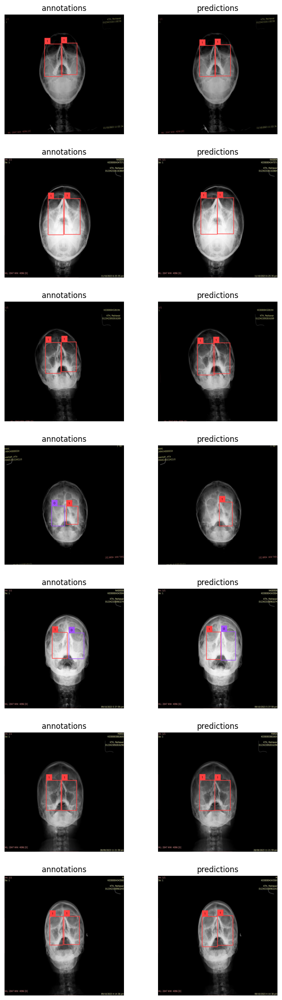

In [ ]:
import supervision as sv

MAX_IMAGE_COUNT = 7

n = min(MAX_IMAGE_COUNT, len(ds.images))

keys = list(ds.images.keys())
keys = random.sample(keys, n)

box_annotator = sv.BoxAnnotator()

images = []
titles = []

for key in keys:
    frame_with_annotations = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=ds.annotations[key],
        skip_label=False
    )
    images.append(frame_with_annotations)
    titles.append('annotations')
    frame_with_predictions = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=predictions[key],
        skip_label=False,

    )
    images.append(frame_with_predictions)
    titles.append('predictions')

%matplotlib inline
sv.plot_images_grid(images=images, titles=titles, grid_size=(n, 2), size=(2 * 4, n * 4))

### Calculate confusion matrix

In [ ]:
!pip install onemetric

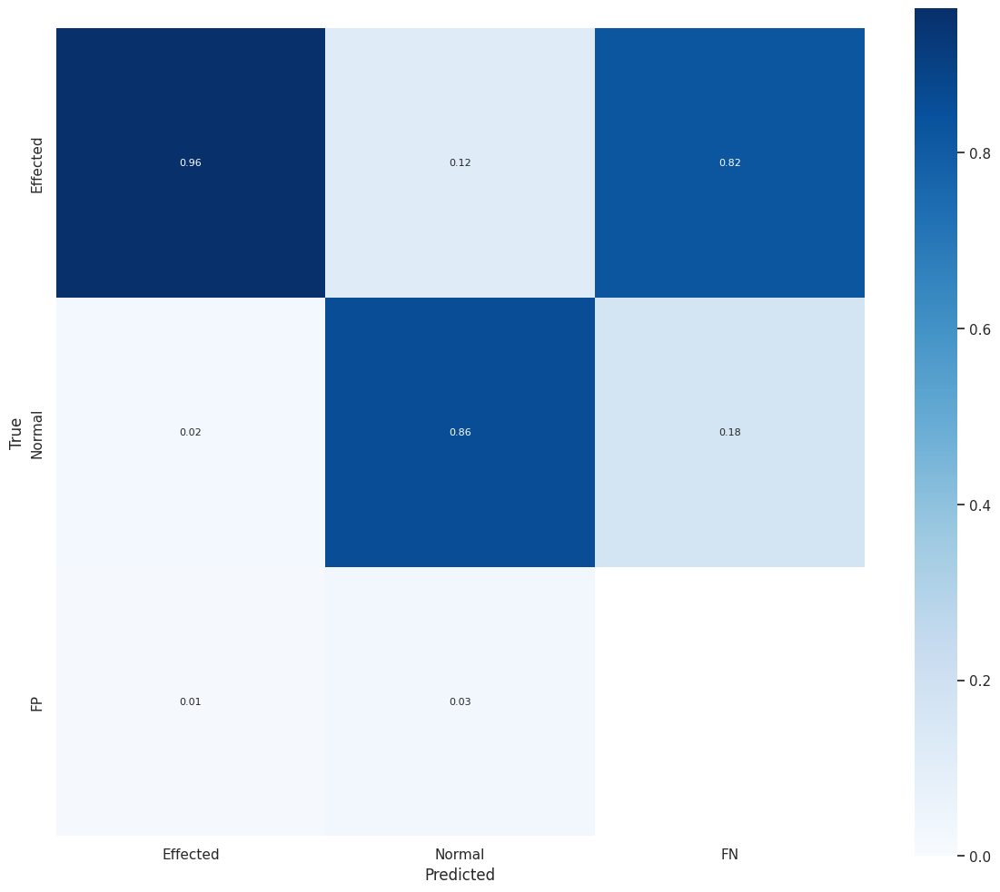

In [ ]:
import os

import numpy as np

from onemetric.cv.object_detection import ConfusionMatrix

keys = list(ds.images.keys())
CONFIDENCE_TRESHOLD = 0.5

annotation_batches, prediction_batches = [], []

for key in keys:
    annotation=ds.annotations[key]
    annotation_batch = np.column_stack((
        annotation.xyxy,
        annotation.class_id
    ))
    annotation_batches.append(annotation_batch)

    prediction=predictions[key]
    prediction_batch = np.column_stack((
        prediction.xyxy,
        prediction.class_id,
        prediction.confidence
    ))
    prediction_batches.append(prediction_batch)

confusion_matrix = ConfusionMatrix.from_detections(
    true_batches=annotation_batches,
    detection_batches=prediction_batches,
    num_classes=len(ds.classes),
    conf_threshold=CONFIDENCE_TRESHOLD
)

confusion_matrix.plot(os.path.join(HOME, "confusion_matrix.png"), class_names=ds.classes)

  # 🏆 That's the END


[2024-02-28 10:53:37] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


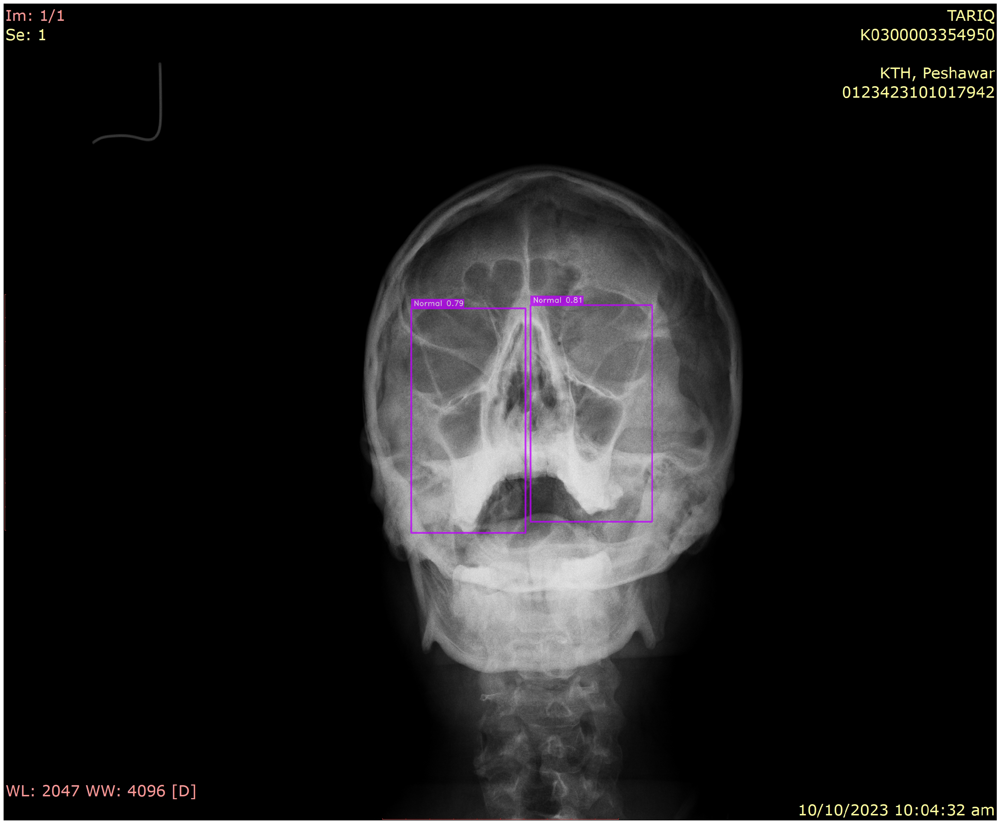

In [ ]:
test_image = "/content/i (85).jpg"
best_model.predict(test_image).show()

[2024-02-28 10:57:34] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


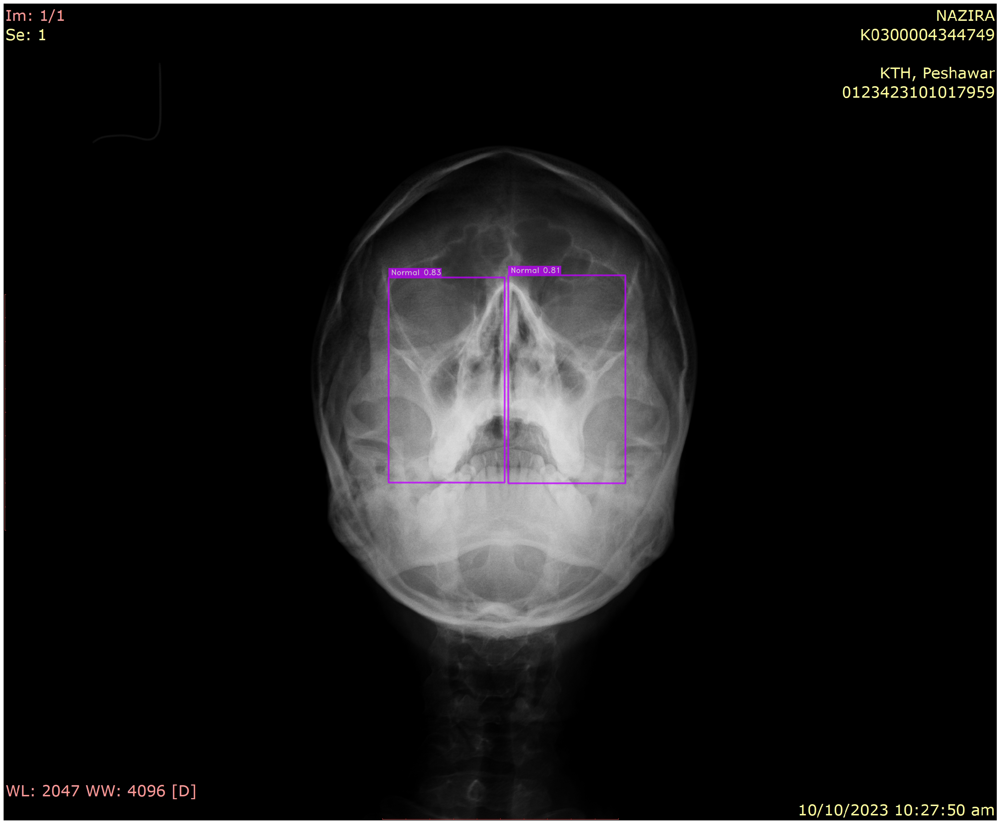

In [ ]:
test_image = "/content/i (79).jpg"
best_model.predict(test_image).show()

[2024-02-28 10:58:46] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


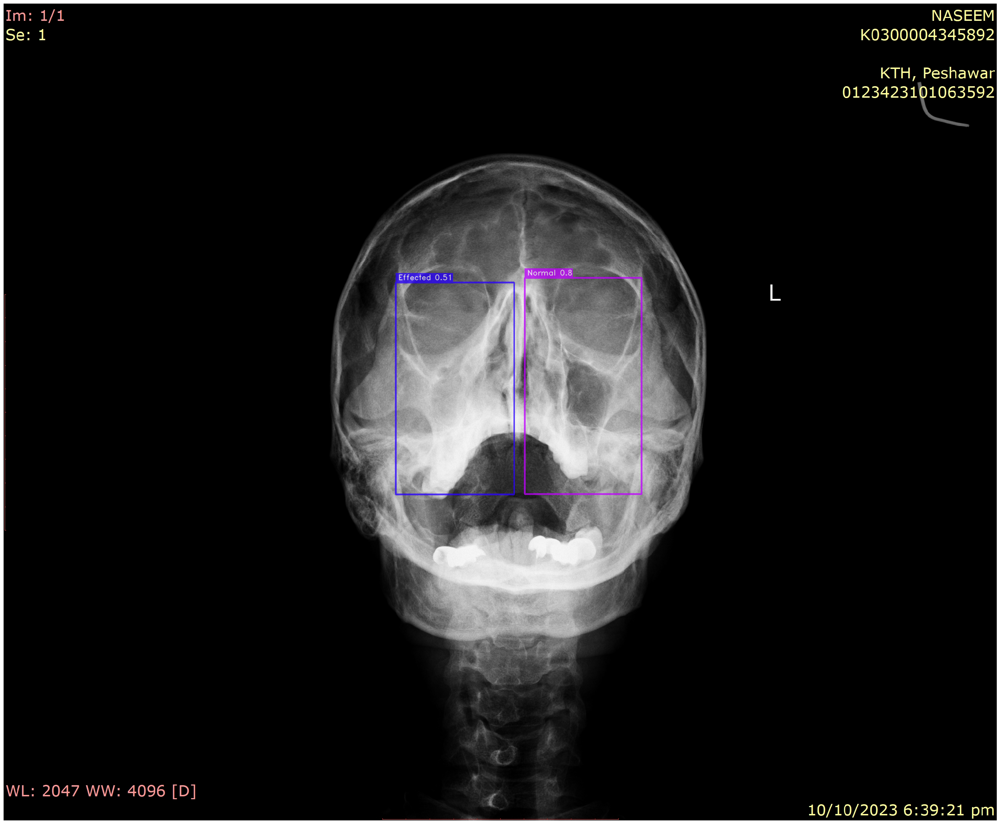

In [ ]:
test_image = "/content/e (12).jpg"
best_model.predict(test_image).show()